<a href="https://colab.research.google.com/github/Hadi-Saghir/Fast-Food-Image-Classification/blob/main/Hadi_Saghir_assignment_5TF078.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Analyzing and Understanding Different Pre-trained Models for Image Recognition and Classification of Fast Food Meals**

## Author: Hadi Saghir 

This lab aims to demonstrate knowledge and application of transfer learning (TL) on convolutional neural networks (CNN) for image recognition and classification. The dataset used in this lab can be found at the following link: [Fast Food Classification Dataset](https://www.kaggle.com/datasets/utkarshsaxenadn/fast-food-classification-dataset
)

The focus of this project is to analyze the effects of different pre-trained models on achieving accurate classification of 10 different fast food items. The investigation includes examining the architecture, model training process, and the provided dataset to gain a better understanding of maximizing accuracy.

This document is divided into the following sections:
1. Prelude
2. Applying the VGG16 model
3. Applying the ResNet50 model
4. Applying the DenseNet model
5. Applying the BiT model
6. Conlusion


Throughout the lab, a 91% accuracy result is achieved, and suggestions are provided for further improving the models by delving deeper into the utilization of transfer learning for this specific task.

# Prelude

The predlude will contain the following parts:

* Initializations of environment
  * Importing dataset
  * Importing and defining needed modules
* setting up the dataset
  * loading the dataset
  * data visualization
* Approach to building a suitible model **(important to understanding the method/approach of this project)**


OBS! A Kaggle API token is require to import the dataset, if you want test out the notebook. An API token can be created by logging into Kaggle -> click on profle in the top right corner -> Account -> Click "Create new API Token" under section 'API'. The API token must be selected and uploaded which should be done in the second code block found under "Prelude" -> "Initializations of environment" -> "Importing dataset"

##Intialize of the environment

###importing dataset

In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"hadisaghir","key":"afed39bd95d24757fa91deefeb6fc4f2"}'}

In [ ]:
!ls -lha kaggle.json

-rw-r--r-- 1 root root 66 Jan 23 01:46 kaggle.json


In [ ]:
! mkdir ~/.kaggle

In [ ]:
! cp kaggle.json ~/.kaggle

In [ ]:
!kaggle datasets download -d utkarshsaxenadn/fast-food-classification-dataset

100% 820M/821M [00:40<00:00, 23.3MB/s]
100% 821M/821M [00:40<00:00, 21.0MB/s]


In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!unzip fast-food-classification-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (1).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (10).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (100).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (1000).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (1001).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (1002).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (1003).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (1004).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (1005).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (1006).jpeg  
  inflating: Fast Food Classification V2/Train/Taquito/Taquito-Train (1007).jpeg  
  inflating: Fast Food Classification V2/T

###importing and defining needed modules

In [ ]:
# Import needed libraries
import tensorflow as tf
print('TensorFlow version:', tf.__version__)

# from tensorflow import keras
# from tensorflow.keras import layers, models and utils
import keras
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Flatten

#from keras.layers.advanced_activations import LeakyReLU
from keras.preprocessing.image import ImageDataGenerator
from keras.applications import VGG16, ResNet50, ResNet50V2, DenseNet121, MobileNet
from keras.optimizers import SGD, Adam

print('Keras version:',tf.keras.__version__)

# Helper libraries
import os
import numpy as np
import sklearn
from   sklearn.model_selection import train_test_split

# Matlab plotting
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px

# Data Loading
from tensorflow import io
import tensorflow.data as tfd
import tensorflow.image as tfi

# Test for GPU and determine what GPU we have
import sys
if not tf.config.list_physical_devices('GPU'):
     print("No GPU was detected. CNNs can be very slow without a GPU.")
     IN_COLAB = 'google.colab' in sys.modules
     if IN_COLAB:
         print("Go to Runtime > Change runtime and select a GPU hardware accelerator.")
else:
     !nvidia-smi -L

TensorFlow version: 2.9.2
Keras version: 2.9.0
GPU 0: A100-SXM4-40GB (UUID: GPU-009682b0-61ed-4cf4-eff8-5b666490e111)


In [ ]:
from tensorflow.python.saved_model.model_utils.mode_keys import EstimatorModeKeys

# Define the parameters
IMG_WIDTH = 256
IMG_HEIGHT = 256
IMG_DEPTH = 3 #the img_transform changes 1 to 3 automatically when greyscale.to.rgb is called
input_shape = (IMG_WIDTH, IMG_HEIGHT, IMG_DEPTH)

BATCH_SIZE = 16 # batch size for generator (must be divisible by batch_size)
batch_size = 32 # batch size for training 

# Define an in-stream transform (gray2color, resize)
def img_transform(images):
 images = tf.image.grayscale_to_rgb(tf.convert_to_tensor(images))
 images = tf.image.resize_with_pad(images, IMG_WIDTH, IMG_HEIGHT, antialias=False)
 return images

# Define a Sequence generator
class Mygenerator(tf.keras.utils.Sequence):
  def __init__(self, x_set, y_set, batch_size):
    self.x, self.y = x_set, y_set
    self.batch_size = batch_size

  def __len__(self):
    return int(np.ceil(len(self.x) / float(self.batch_size)))

  def __getitem__(self, idx):
    end = min(self.x.shape[0], (idx + 1)*batch_size)
    batch_x = self.x[idx * self.batch_size : end]
    batch_y = self.y[idx * self.batch_size : end]
    # transform the images to fit the model constraints
    x=img_transform(batch_x)
    print("batch_y = ", batch_y.shape)
    y=to_categorical(batch_y)
    print("y = ", y.shape)
    return np.array(x), np.array(y)

##Setting up the dataset

###loading the dataset

https://www.tensorflow.org/tutorials/load_data/images

In [ ]:
#Other model attributes
RESIZE_TO = 256


def load_data(example):
    ground_truth = {
        "image":io.FixedLenFeature([],tf.string),
        "label":io.FixedLenFeature([],tf.int64)
    }
    example = io.parse_single_example(example, ground_truth)
    image, label = example['image'], example['label']
    return image, label

def process_data(image, label):
    image = tfi.decode_jpeg(image, channels=3)
    image = tfi.resize(image, [RESIZE_TO, RESIZE_TO])
    image = tf.cast(image, tf.float32)
    image = image/255.
    return image, label

In [ ]:
# Get the Class Names
class_names = ['Baked Potato', 'Burger', 'Crispy Chicken', 'Donut', 'Fries', 'Hot Dog', 'Pizza', 'Sandwich', 'Taco', 'Taquito']
num_classes = 10

# Show
print(f"Number Of Classes : {num_classes}")
print(f"Class Names : {class_names}")

Number Of Classes : 10
Class Names : ['Baked Potato', 'Burger', 'Crispy Chicken', 'Donut', 'Fries', 'Hot Dog', 'Pizza', 'Sandwich', 'Taco', 'Taquito']


In [ ]:
# Specify Paths
tfr_train = '/content/Fast Food Classification V2/TFRecords/Train/*.tfrecord'
tfr_valid = '/content/Fast Food Classification V2/TFRecords/Valid/*.tfrecord'
tfr_test  = '/content/Fast Food Classification V2/TFRecords/Test/*.tfrecord'

# Params
AUTOTUNE = tfd.AUTOTUNE
BATCH_SIZE = 512
BUFFER_SIZE = 1000

In [ ]:
# Train Data
files = tfd.Dataset.list_files(tfr_train)
data = tfd.TFRecordDataset(files, num_parallel_reads=AUTOTUNE)
data = data.map(load_data, num_parallel_calls=AUTOTUNE)
data = data.map(process_data, num_parallel_calls=AUTOTUNE)
data = data.shuffle(BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
train_ds = data.prefetch(AUTOTUNE)


In [ ]:
# Valid Data
files = tfd.Dataset.list_files(tfr_valid)
data = tfd.TFRecordDataset(files, num_parallel_reads=AUTOTUNE)
data = data.map(load_data, num_parallel_calls=AUTOTUNE)
data = data.map(process_data, num_parallel_calls=AUTOTUNE)
data = data.shuffle(BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
valid_ds = data.prefetch(AUTOTUNE)

In [ ]:
# Test Data
files = tfd.Dataset.list_files(tfr_test)
data = tfd.TFRecordDataset(files, num_parallel_reads=AUTOTUNE)
data = data.map(load_data, num_parallel_calls=AUTOTUNE)
data = data.map(process_data, num_parallel_calls=AUTOTUNE)
data = data.shuffle(BUFFER_SIZE).batch(BATCH_SIZE, drop_remainder=True)
test_ds = data.prefetch(AUTOTUNE)

##Data visualization

In [ ]:
#hämtad från: https://www.kaggle.com/code/utkarshsaxenadn/fast-food-v2-big-transfer-acc-91
def show_images(data, class_names=class_names, model=None, GRID=[6,6], SIZE=(25,25)):
    
    # Plot configurations
    n_rows, n_cols = GRID
    n_images = n_rows * n_cols
    plt.figure(figsize=SIZE)
    
    # Iterate through the Data
    i=1
    for images, labels in iter(data):
        
        # Select data randomly
        id = np.random.randint(len(images))
        image, label = tf.expand_dims(images[id], axis=0), class_names[int(labels[id])]
        
        # Make Prediction
        if model is not None:
            prediction = model.predict(image)[0]
            score = np.round(max(prediction), 2)
            pred = class_names[np.argmax(prediction)]
            title = f"True : {label}\nPred : {pred}\nScore : {score}"
        else:
            title=label
        
        # Plot Image
        plt.subplot(n_rows, n_cols, i)
        plt.imshow(image[0])
        plt.axis('off')
        plt.title(title)
        
        # Break Loop
        i+=1
        if i>n_images: break
    
    # Final Plot
    plt.show()
    

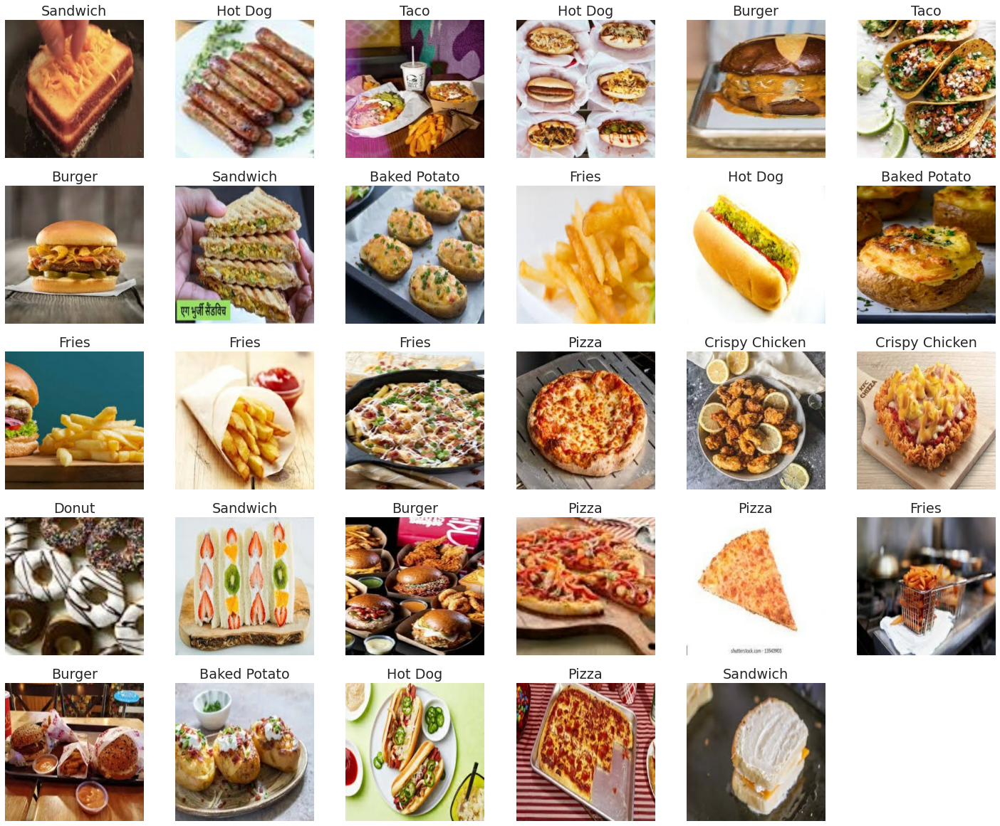

In [ ]:
show_images(train_ds)

In [ ]:
# Calculate the class distribution
class_dis = [num_classes for name in class_names]

# Virtualize class distribution
fig = px.pie(names=class_names, values=class_dis, hole=0.3)
fig.update_layout({"title":{'text':"Training Class Distribution", 'x':0.48}})
fig.show()

##Approach to building a suitible model

### **Analysis of the dataset**

This analysis will evalute the dataset given to us, which can be further used to evalutate the suitable model for classification

The model has an even distribution between the different classes, but some of the food classes appear in abnormal forms.

Burgers and Crispy chicken tend to overlap a lot as well with crispy chicken burgers, which as normal personal i don't know which one to classify as.

Visualization of the data directly shows a potential struggle with pattern detection, which is the lack of focus on the food itself and its appearance in many forms. a hotdog might be in a jar, sandwich, with sauces on top or fried onions. The hotdog can be on a dish, held or shown in an advertisment. Cripsy chicken burgers can be beside a side of fries, which is often the case with burgers. A pizza might be a single pizza or whole pizza sliced or whole.

When deciding the apt model for these kinds of images, which vary a lot in depication of the same class. As i see it now, a large model that discets a picture to different parts. There needs to be a smooth transition from looking at the picture as a whole that needs to be filtered out, looking at a medium size of the picture containing a chunk or all the food article (shape), and finally focusing on the small details (texture).

**Facts on the dataset**

*   Image resolution: 256x256 (RGB) 
*   Dataset size: 20 000 total
*   Total classes: 10 classes
*   Data per class:  2 000 pciture per class

### **Analysis of the different models**

There are a few factors to consider when choosing a pre-trained model for transfer learning. One important factor is the similarity between the task you are trying to solve and the task the pre-trained model was trained on. If the tasks are similar, a pre-trained model trained on that task will likely be a good choice. Additionally, the size of the pre-trained model and the amount of data it was trained on can also be important factors. A larger model trained on more data will likely perform better, but may also be more computationally expensive to use. Finally, you should also consider the specific architecture of the model and whether it is well-suited for the problem you are trying to solve (what is the best thing to pick up on,e.g. texture of food).

**ImageNET Dataset**

The ImageNet dataset, on which the original ResNet50, VGG-16 an DenseNet were trained, contains over 14 million images and 1000 classes. The classes in ImageNet are organized into a hierarchical structure, with many classes at the top level and subclasses under them. The classes in the dataset are organized into a hierarchy of WordNet synsets, which are group of synonyms that represent a concept.

The classes in the dataset cover a wide variety of objects, animals, scenes, and other concepts, such as:

Animals (e.g. dog, cat, horse, bird)
Objects (e.g. guitar, keyboard, book, clock)
Scenes (e.g. beach, forest, mountain)
Vehicles (e.g. airplane, car, boat)
Food (e.g. pizza, hot dog, spaghetti)
People (e.g. baby, boy, girl, woman)
Activities (e.g. playing guitar, typing on a computer)
Sports (e.g. baseball, soccer, tennis)
Electronics (e.g. cell phone, laptop, camera)
etc.

* **VGG16**: 

This is a popular CNN architecture that has been trained on the ImageNet dataset. It has 16 layers and is known for its good performance on image classification tasks. 

This model achieves 92.7% top-5 test accuracy on the ImageNet dataset which contains 14 million images belonging to 1000 classes with a fixed size of 224*224 [RGB (224, 224, 3)]. This is a little smaller than our input of (256, 256, 3). This may be an advantage or disadvantage.

The general structure of the model having 3*3 filter size and the same padding -> max pool layer of stride (2, 2) can cause overfitting quickly with the dataset we are given. The cheese of the pizza maybe be seen on a baked potato, red and yellow combination of ketchup and musturd bottle may be mistake for sauce on a hotdog, or the distinct color and texture of the fries may miss categorize burgers with a side of fries.

* **ResNet-50**: 

This is a popular convolutional neural network (CNN) architecture that has been trained on the ImageNet dataset. It has 50 layers and is known for its good performance on image classification tasks.


* **DenseNet - a more complex model**

With access to NVIDIA V100 or A100 Tensor Core GPUs (Google premium, I ain't that rich), and a dataset of 20k images with a resolution of 256x256 for fast food image classification, then you should have enough computational power to use a larger and more complex pre-trained model.

One of the contenders is one of the DenseNet models, DenseNet121, DenseNet169 or DenseNet201. These models are known for their high performance on image classification tasks and have been trained on large datasets like ImageNet, they are also efficient in terms of computational power.

> Another option to consider is EfficientNet models, which are state-of-the-art models that are trained on large datasets and are known for achieving good accuracy with relatively low computational cost. I will however not be testing out this model in this project, just stating for further consideration.


* **Transfer learning from model pre-trained on food**


Big Transfer (BiT) is a pre-trained model developed by Google that is based on the ResNet50 architecture. BiT is trained on a much larger dataset than traditional models, and it is designed to be fine-tuned on a wide variety of tasks, including image classification, object detection, and segmentation. The goal of BiT is to improve the transferability of pre-trained models and achieve better performance on downstream tasks with smaller amounts of labeled data. BiT is a recent development in the field of computer vision, and it is considered as a state-of-the-art model in many benchmarks.

Fine-tuning the Big Transfer (BiT) pre-trained model on the ImageNet "food" subtree, can and should potentially improve the accuracy of image classification on a dataset of 20k fast food pictures. 

> I was able to find a BiT-m R50x1 fine-tuned on the ImageNet "food" subtree in tensorflow hub: [TensorFlow Hub - link to model](https://tfhub.dev/google/experts/bit/r50x1/in21k/food/1)


The idea behind transfer learning is that the model has already learned useful features from the large and diverse ImageNet dataset. By fine-tuning the model on a smaller dataset that is more similar to the task at hand (in this case, images of fast food), the model can learn to better distinguish between different types of fast food. This can lead to better performance on the downstream task of fast food image classification.

However, it's worth noting that the improvement in accuracy will depend on the similarity between the images in the "food" subtree and the fast food images in your dataset, and the size of your dataset compared to the one used for fine-tuning. Additionally, it's also worth noting that the performance of the model will be affected by other factors such as the quality of the images, the preprocessing done on the data, and the design of the classification model that you use.

* **Fine tuning**

It's important to note that fine-tuning a pre-trained model on a small dataset can lead to overfitting and low performance so, it's important to have enough data to fine-tune the model and use techniques such as data augmentation and regularization to avoid overfitting. For ResNet, VGG and a behemoth like DenseNet, 20k images can be considered as a relatively small dataset when it comes to fine-tuning a pre-trained model like DenseNet. 

While it is possible to fine-tune a pre-trained model on a small dataset, it can be challenging to achieve good performance due to the risk of overfitting. Techniques such as data augmentation and regularization to avoid overfitting. Data augmentation is a technique that artificially increases the size of the dataset by applying various transformations to the original images. Regularization is a technique that prevents overfitting by adding a penalty term to the loss function that discourages large weights.

This project will focus on exploring the different models a base for classification of this dataset rather than fine-tuning the models for achieving highest result. I will, however, be fine-tuning the VGG model to note improvement achieved. Hwoever, DenseNet and BiT will not be fine-tuned.


#Applying the VGG16 model

The VGG-16 model is a well-known convolutional neural network (CNN) architecture that has been trained on the extensive ImageNet dataset. It has gained recognition for its impressive performance in image classification tasks and its ability to extract discernible features from images.

There are several scenarios where the VGG-16 model is highly suitable:

1. Image classification tasks: The VGG-16 model's pre-training on the vast and diverse ImageNet dataset equips it with a rich understanding of various object classes and scenes. Consequently, it has learned valuable features that are beneficial for image classification tasks. This makes it an excellent choice either as a feature extractor or as a pre-trained model for transfer learning.

2. Similarity between the task and the dataset: When the classes and images in your specific task exhibit similarities to those found in the ImageNet dataset, leveraging the pre-trained VGG-16 model becomes particularly advantageous. By utilizing the learned features, you can enhance the accuracy and effectiveness of your own model on comparable data.

3. Small datasets: Despite its training on the large-scale ImageNet dataset, the VGG-16 model showcases the ability to generalize well, even when confronted with smaller datasets. This characteristic makes it an excellent candidate for situations where collecting extensive labeled data is challenging. By leveraging the VGG-16 model's pre-trained weights, you can benefit from its comprehensive feature representation.

4. Computational resources: Compared to more complex architectures like ResNet, the VGG-16 model adopts a simpler and shallower design. With fewer layers and parameters, it demands less computational power and memory, making it a feasible choice for scenarios with limited computational resources. This advantage enables you to employ the VGG-16 model effectively without compromising performance.

Considering these factors, the VGG-16 model proves to be a versatile and powerful tool for image classification tasks. Its ability to extract meaningful features, even in the presence of limited data, empowers researchers and practitioners in various computer vision applications.

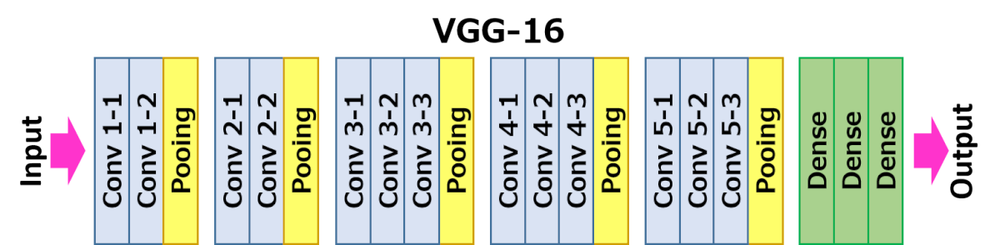

###Manual testing

The 'image_batch' is a tensor of the shape (32, 256, 256, 3). This is a batch of 32 images of shape 256x256x3 (the last dimension refers to color channels RGB). The label_batch is a tensor of the shape (32,), these are corresponding labels to the 32 images.

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 256, 256, 3)
(32,)


In [ ]:
# Define our vgg_model
vgg_model = VGG16(    include_top=False,
                      weights="imagenet",
                      input_tensor= None,
                      input_shape = input_shape,
                      pooling=None,
                      classes=num_classes,
                      classifier_activation="softmax",
                 )

# Adjust the trainable layers are not trainable
for layer in vgg_model.layers[:-5]:
    layer.trainable = False

# Creating dictionary that maps layer names to the layers
layer_dict = dict([(layer.name, layer) for layer in vgg_model.layers])

# Getting output tensor of the last VGG layer that we want to include
x = layer_dict['block5_pool'].output

x = keras.layers.BatchNormalization(axis=-1)(x)  
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
x = Dense(units=num_classes, activation='softmax')(x)

# Creating new model. Please note that this is NOT a Sequential() model.
from keras.models import Model
model = Model(vgg_model.input, x)

model.summary()
#vgg_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

In [ ]:
# Compile the model
model.compile(
  optimizer='Adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy']
)

# Generate data streams from data sets
epochs = 100

es=tf.keras.callbacks.EarlyStopping(monitor='val_loss', verbose=1, patience=3, mode='auto', min_delta=0, restore_best_weights = True)
rl = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, verbose=1, mode='auto', epsilon=0.0001, cooldown=2, min_lr=0)
callbacks =[es,rl]

# Training using existing data
history = model.fit(train_ds,
                    epochs=epochs, 
                    shuffle=True,
                    verbose=1, 
                    batch_size=batch_size,
                    validation_data=valid_ds,
                    callbacks=callbacks
                    )

# Evaluate
test_loss, test_acc = model.evaluate(test_ds)


# Print evalutation
print('Test accuracy: %.3f' % test_acc)

Epoch 1/100
468/468 [==============================] - 49s 89ms/step - loss: 1.4181 - accuracy: 0.5323 - val_loss: 2.7552 - val_accuracy: 0.4728 - lr: 0.0010
Epoch 2/100
468/468 [==============================] - 39s 83ms/step - loss: 0.8727 - accuracy: 0.7271 - val_loss: 17.4880 - val_accuracy: 0.4839 - lr: 0.0010
Epoch 3/100
468/468 [==============================] - 39s 83ms/step - loss: 0.6496 - accuracy: 0.7961 - val_loss: 0.9855 - val_accuracy: 0.6984 - lr: 0.0010
Epoch 4/100
468/468 [==============================] - 39s 83ms/step - loss: 0.4970 - accuracy: 0.8433 - val_loss: 1.2663 - val_accuracy: 0.6571 - lr: 0.0010
Epoch 5/100
468/468 [==============================] - ETA: 0s - loss: 0.4039 - accuracy: 0.8721
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
468/468 [==============================] - 39s 82ms/step - loss: 0.4039 - accuracy: 0.8721 - val_loss: 1.0789 - val_accuracy: 0.7351 - lr: 0.0010
Epoch 6/100
468/468 [==========================

##visualizing results

In [ ]:
# Evaluate
test_loss, test_acc = model.evaluate(test_ds)


# Print evalutation
print('Test accuracy: %.3f' % test_acc)

46/46 [==============================] - 3s 52ms/step - loss: 0.7043 - accuracy: 0.8152
Test accuracy: 0.815


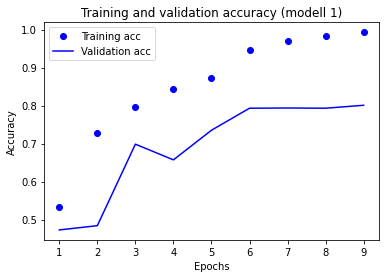

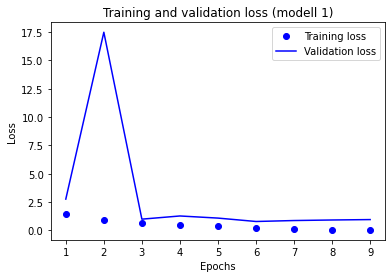

In [ ]:
epochrange = range(1, callbacks[0].stopped_epoch + 2) # change to the epoch it stopped at when adding the early stopping method
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochrange, train_acc, 'bo', label='Training acc')
plt.plot(epochrange, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(epochrange, train_loss, 'bo', label='Training loss')
plt.plot(epochrange, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

###Confusion matrix

46/46 [==============================] - 3s 51ms/step


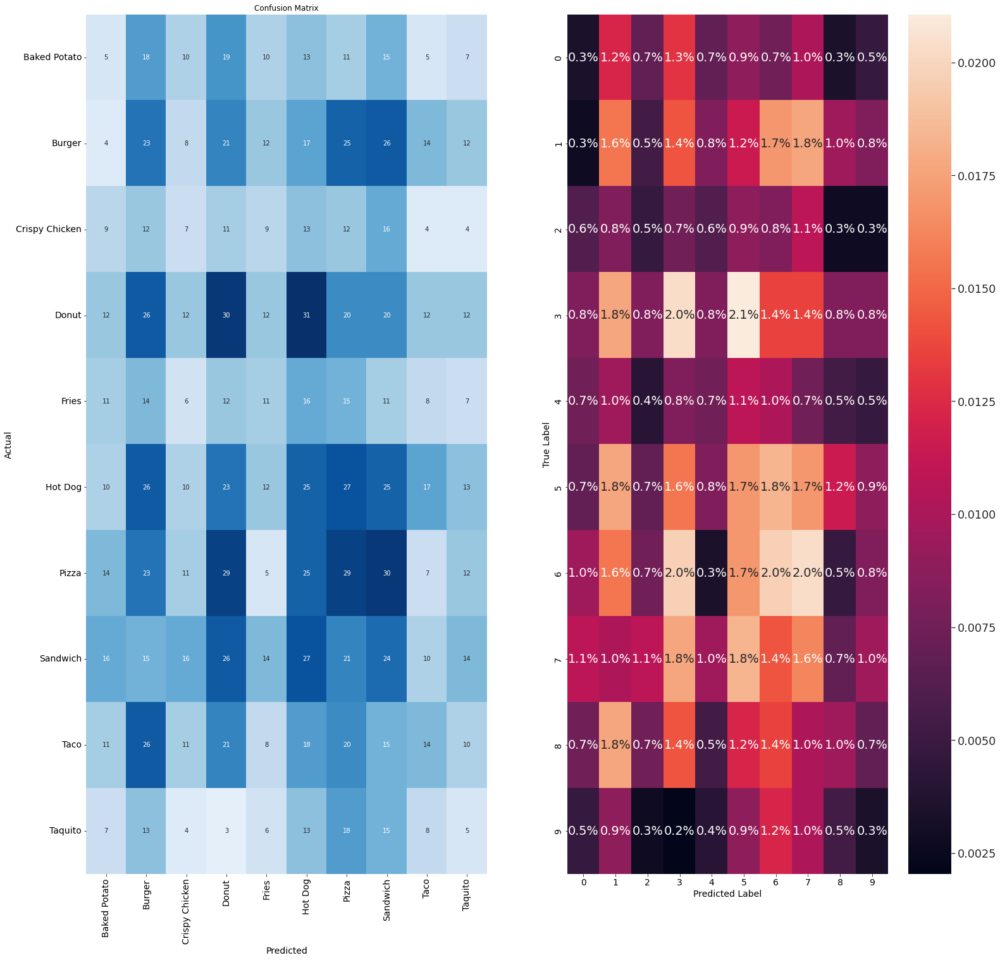

In [ ]:
#Hämtad från 
##plotting the confusion matrix (copied from kaggle)
import itertools
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(valid_ds):
    
    # Predict the values from the validation dataset and convert to one hot vectors 
    predicted_categories = np.argmax(model.predict(valid_ds), axis = 1) 
    true_categories = tf.concat([y for x, y in valid_ds], axis=0)
    # compute the confusion matrix
    cm = confusion_matrix(predicted_categories, true_categories)

    plt.figure(figsize=(25, 25))
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
    plt.xticks(np.arange(num_classes) + .5, class_names, rotation=90, fontsize=14)
    plt.yticks(np.arange(num_classes) + .5, class_names, rotation=0, fontsize=14)
    plt.xlabel("Predicted", fontsize=14)
    plt.ylabel("Actual", fontsize=14)
    plt.title("Confusion Matrix")
    
    plt.subplot(1, 2, 2)
    sns.set(font_scale=1.6)
    sns.heatmap(cm / np.sum(cm), annot=True, fmt='.1%')
    plt.xlabel('Predicted Label', fontsize=14)
    plt.xticks(fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.yticks(fontsize=14)

    plt.show()


# plot the confusion matrix
plot_confusion_matrix(test_ds)

1/1 [==============================] - 0s 22ms/step


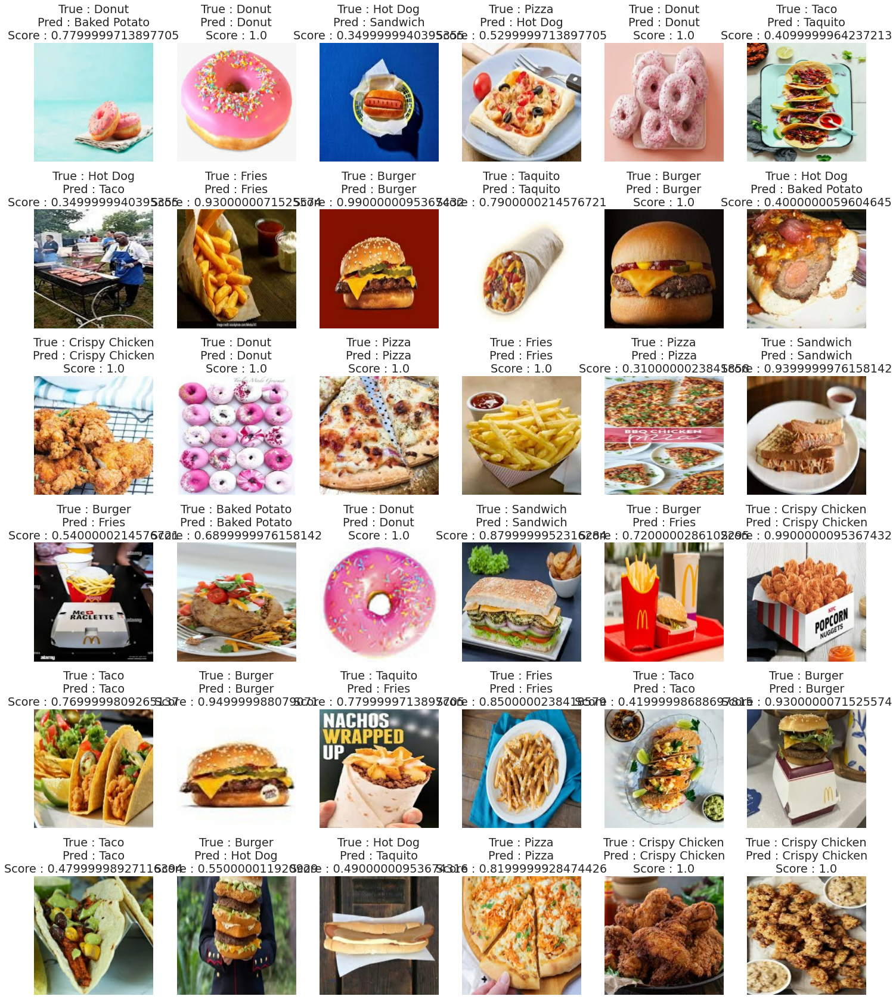

In [ ]:
show_images(test_ds, model=model, SIZE=[25,30])

##Analysis

This model that will be used further is called mymodel.1

* x = keras.layers.BatchNormalization(axis=-1)(x)  
* x = Flatten()(x)
* x = Dense(512, activation='relu')(x)
* x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
* x = Dense(units=num_classes, activation='softmax')(x)


Any further tweak will be labeled mymodel.2 and so on. Thhis helps keep the analysis compact and more readable.




* **VGG16(Block 3)(untrainble) -> mymodel.1**

Trainable params = 18 million (this made the training very slow)

Evalutation: 0.43

The model stopped at 7 epochs as after the 3rd epoch the val_acc began to stagnat despite the train_acc was increasing. 

The dense layer (512) is too large for the VGG model and VGG16(Block 3) is too small. We get the burden of too many trainble parameter with less benefits of the transfer learning.

* **VGG16(Block 5)(untrainble) -> mymodel.1**

Total params: 18,912,458
Trainable params: 4,196,746 (a fair amount of parameters)
Non-trainable params: 14,715,712

Evalutation: 0.61

The model stopped at 7 epochs as after the 3rd epoch the val_acc began to stagnat despite the train_acc was increasing. 

overfitting likely caused by the struggle discussed in the analysis under "Prelude" -> "Setting up the dataset" -> "Analysis", this is very promement in the results we are getting. The train_acc is increasing from epoch 1 to 3 from 0.60 to 0.94. The learning rated is reduced to try try to avoid overfitting.

* **VGG16(Block 4)(untrainble) -> mymodel.1**

Total params: 24,415,946
Trainable params: 16,779,658 (4 times block5_pool)
Non-trainable params: 7,636,288

Evalutation: 0.607

The model stopped at 6 epochs. The val_acc was still 0.3 - 0.4 behind the train_Acc. However, they both were increasing together which made it overfit less

overfitting likely caused by the struggle discussed in the analysis under "Prelude" -> "Setting up the dataset" -> "Analysis", this is very promement in the results we are getting. The train_acc is increasing from epoch 1 to 3 from 0.60 to 0.94. The learning rated is reduced to try try to avoid overfitting.


* **VGG16(Block5_pool)(untrainble) ->**

**model softmax**
x = keras.layers.Dropout(0.2)(x)  
x = Dense(units=num_classes, activation='softmax')(x)

Total params: 15,042,378
Trainable params: 2,687,498
Non-trainable params: 12,354,880

Test accuracy: 0.744

The model stopped at 6 epochs. The val_acc and train_acc were close with a 0.1 - 0.2 difference. The test continued inscreasing at epoch 3 will val_acc stagnanted. in comparison to previous models, val_acc increased at the same rate, and the only difference being that is started achieved a 0.64 val_acc in the first epoch, higher than other 

Changing the model has made a massive improvement from where model 512, which could be causing the overfitting.

* **VGG16(Block 1 to 4)(untrainble) -> VGG(Block 5)(trainble) -> mymodel.1**

Total params: 31,499,594
Trainable params: 23,863,306
Non-trainable params: 7,636,288

Test accuracy: 0.814

The training set accuracy after the first epoch is 0.5323 and the validation set accuracy is 0.4728. The validation set accuracy is decreasing after the first epoch, but in the second epoch it was able to increase. The training set accuracy is also increasing over time, reaching a maximum of 0.9830 after 8 epochs. The validation set accuracy is less than the training set accuracy , and it reaches a maximum of 0.8007 after 6 epochs. The training session is stopped after 9 epochs due to early stopping, meaning that the model's performance on the validation set didn't improve for a certain number of consecutive epochs. The final test accuracy is 0.814.

This training session tells you that the model's performance on the validation set is not consistent. The validation accuracy improves as the number of epochs increases from 47.28% to 80.07% but the validation loss increases from 2.7552 to 0.9480. This indicates that the model is overfitting to the training set and not generalizing well to the validation set. The best validation accuracy was achieved at epoch 6, and the model's performance did not improve after that.

There are a few things that can be done to address this issue:

* Introduce techniques to reduce overfitting, such as dropout and weight decay
* Gather more data to increase the size of the training set
* Use techniques such as data augmentation to artificially increase the size of the training set(which is used for DenseNet and BiT)
* Experiment with different architectures or hyperparameter values


### **confusion matrix analysis**

The heatmap is annotated with the actual count of the observations, and the second heatmap is the normalized one with the percentage of observations. It's important to note that the better the model, the closer the entries of the diagonal line should be to 1, meaning that the model is correctly classifying the input.

A confusion matrix that is not diagonal can indicate that the model is making errors in its predictions, particularly when the misclassifications are spread across multiple classes, indicating that the model is having difficulty differentiating between certain classes. However, a high accuracy score of 91% suggests that the model is still performing well overall.

There are a few possible explanations for why this might be the case:

* Confusion between similar classes: If the classes in the dataset are very similar, it may be difficult for the model to differentiate between them, leading to a high rate of misclassifications. However, if the majority of the misclassifications are between similar classes, the overall accuracy can still be high.

* Complex data: If the dataset is complex, it is possible that the model is not able to capture all the patterns in the data, which can lead to misclassifications, but still has learned the main patterns which are enough to achieve a good accuracy score.

A high accuracy score does not necessarily mean that the model is perfectly classifying the input, but it can indicate that the model is still performing well overall. It is important to analyze the confusion matrix in conjunction with the accuracy score to get a better understanding of the model's performance.

The areas of confusion are the following: Tacos, Taquitos, Baked potatoes, cripsy chicken and fries. 

VGG networks are known for their heavy use of convolutional layers with small filters (3x3) to extract fine-grained features such as edges and textures. This helps the network to learn fine-grained features such as textures, which can be useful for tasks such as object recognition in images. However, VGG networks are relatively deep and have a large number of parameters, which can make them prone to overfitting and difficult to train. This confusion matrix show a very arbitrary areas of confusion.

The donut was for example confused with hot dog and burger, which are often the three that share the same texture bread, name brioche-like bread.

Pizza was confused with baked potato that are topped with cheese at times, donut, hot dog, sandwhich. A similar pattern but with the addition of confusion caused by cheese drenched fast foods.

Cases such as the fries, cripsy chicken and taquito are often not heavily biased to one class, not even their own, which suggests the that model was unable to extract feature to classify. For example, I predicted it confusion with crispy chicken found in hamburgers, but that is not the case as generalization on feature of the cripsy chicken are not picked up on. If crispy chicken texture is confused hot dog, pizza and sandwich mostly, but they share no similarity.


##fine-tune the model

In [ ]:
# Get Keras Tuner (if in colab)
import os


!pip install keras-tuner -q;

import keras_tuner
print('Keras Tuner version:', keras_tuner.__version__)

# Get some tuner search functions
from keras_tuner.tuners import BayesianOptimization

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.7/135.7 KB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 57.7 MB/s eta 0:00:00
Keras Tuner version: 1.1.3


In [ ]:
input_shape_m1 = (256,256,3)

# Kompletera denna kod med din modell
def build_model_MyModelOne(hp):
  # Define our vgg_model
  vgg_model = VGG16(    include_top=False,
                        weights="imagenet",
                        input_tensor= None,
                        input_shape = input_shape,
                        pooling=None,
                        classes=num_classes,
                        classifier_activation="softmax",
                  )

  # Adjust the trainable layers are not trainable
  for layer in vgg_model.layers[:hp.Choice('trainble', [-1, -5, -9])]:
      layer.trainable = False

  # Creating dictionary that maps layer names to the layers
  layer_dict = dict([(layer.name, layer) for layer in vgg_model.layers])

  # Getting output tensor of the last VGG layer that we want to include
  x = layer_dict[hp.Choice('last_block', ['block3_pool', 'block4_pool', 'block5_pool'])].output

  x = keras.layers.BatchNormalization(axis=-1)(x)  
  x = Flatten()(x)
  x = Dense(units=hp.Int('units', 32, 256), activation='relu')(x)
  x = tf.keras.layers.LeakyReLU(alpha=0.1)(x)
  x = Dense(units=num_classes, activation='softmax')(x)

  # Creating new model. Please note that this is NOT a Sequential() model.
  from keras.models import Model
  model = Model(vgg_model.input, x)

  optimizer = hp.Choice('optimizer', ['adam', 'sgd'])
  learning_rate = hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])
  if optimizer == 'adam':
      optimizer = Adam(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3]))
  else:
      optimizer = SGD(learning_rate=hp.Choice('learning_rate', values=[1e-2, 1e-3]), momentum=0.9)

  ##### You can also try some other learning rates in the next line, or use another optimizer with other parameters
  model.compile(optimizer=optimizer,
              loss='sparse_categorical_crossentropy', 
              metrics=['accuracy'])
  

  
  return model

In [ ]:
# To get more stable results we are repeating the runs two times for each parameter setup
MAX_TRIALS = 20         # represents the number of hyperparameter combinations that will be tested by the tuner
EXECUTION_PER_TRIAL = 2 # the number of models that should be built and fit for each trial for robustness purposes

In [ ]:
# To have batch_size as a hyperparameter we need to define our own tuner
# In this case, we are basing it on the BayesianOptimization tuner found in
# https://keras-team.github.io/keras-tuner/documentation/tuners/#bayesianoptimization-class
class MyTuner(keras_tuner.tuners.BayesianOptimization):
  def run_trial(self, trial, *args, **kwargs):
    # You can add additional HyperParameters for preprocessing and custom training loops
    # via overriding `run_trial`
    kwargs['batch_size'] = trial.hyperparameters.Int('batch_size', 32, 512, step=32, default=256)
    return super(MyTuner, self).run_trial(trial, *args, **kwargs)

In [ ]:
# Bayesian search which also searches for batch_size
tuner = MyTuner(
    build_model_MyModelOne, ##### Laboration: Change this to 'build_model_MyModel' #####
    max_trials=MAX_TRIALS,
    objective='val_accuracy',
    executions_per_trial=EXECUTION_PER_TRIAL,
    directory='output',
    overwrite=True,
    num_initial_points=10, # Start with 10 random points and then do more structured search
    project_name='Fast Food Classification V2'
)

In [ ]:
# Do the hyperparameter search
# I set the no of epochs to 6 to speed up the search in this excersise, better would have been 10
noepochauto = 6   ## Max number of epochs per trail (but we have early stopping so this max is probably not reached)
es = tf.keras.callbacks.EarlyStopping('val_loss', patience=2, restore_best_weights = True)
# Note we do not need to_catagorical as we use loss='sparse_categorical_crossentropy'
tuner.search(train_ds, 
             epochs=noepochauto, 
             validation_data=valid_ds, 
             callbacks=[es])

Trial 20 Complete [00h 02m 25s]
val_accuracy: 0.554329127073288

Best val_accuracy So Far: 0.7768061757087708
Total elapsed time: 01h 09m 32s


In [ ]:
# Let us dump the n-best

if True:
  explorenbest = 5

  # Suppress warnings about optimizer state not being restored by tf.keras.
  tf.get_logger().setLevel('ERROR')

  # Print a heading
  vals = tuner.get_best_hyperparameters(num_trials=explorenbest)[0].values
  print('Test accuracy ', end = '')
  for keys,values in vals.items():
      print('%15s ' %(keys), end = '')
  print('\n')

  # Now print each trail on a seperate row from best to worst
  for ix in range(0,explorenbest): 
    # evaluate this trail
    model = tuner.get_best_models(num_models=explorenbest)[ix]
    test_loss, test_acc = model.evaluate(test_ds, verbose=0)
    print('%15.3f ' % test_acc , end = '')
    # get this trail's hyperparameters
    vals = tuner.get_best_hyperparameters(num_trials=explorenbest)[ix].values
    for keys,values in vals.items():
      print('%15.4s ' %(values), end = '')
    # end this line and start the trail
    print()

Test accuracy        trainble      last_block           units       optimizer   learning_rate      batch_size 

          0.776              -9     block5_pool             220            adam          0.0001             352 
          0.787              -9     block5_pool             256             sgd          0.0001              64 
          0.787              -9     block5_pool              32             sgd          0.0001              32 
          0.796              -9     block5_pool             256             sgd          0.0001             512 
          0.762              -9     block4_pool             115            adam          0.0001              32 


In [ ]:
# Get the best model so far
model = tuner.get_best_models(num_models=1)[0]
# Dump the best hyperparameters found
vals = tuner.get_best_hyperparameters(num_trials=5)[4].values
#for keys,values in vals.items():
   # print('%20s = %3.4g' %(keys,values))
    
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 256, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 256, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 128, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 128, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 128, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 64, 128)       0     

###visualizing results

In [ ]:
# Evaluate
test_loss, test_acc = model.evaluate(test_ds)


# Print evalutation
print('Test accuracy: %.3f' % test_acc)

46/46 [==============================] - 2s 27ms/step - loss: 0.7981 - accuracy: 0.7751
Test accuracy: 0.775


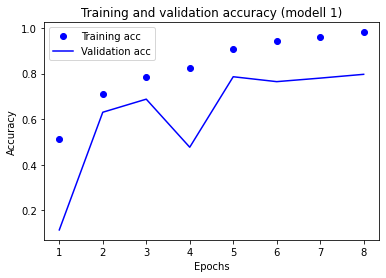

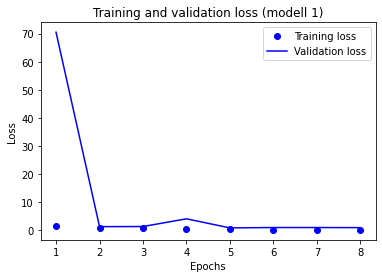

In [ ]:
epochrange = range(1, callbacks[0].stopped_epoch + 2) # change to the epoch it stopped at when adding the early stopping method
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochrange, train_acc, 'bo', label='Training acc')
plt.plot(epochrange, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(epochrange, train_loss, 'bo', label='Training loss')
plt.plot(epochrange, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

###Analysis of the fine-tuning


Test evalutation: 0.796             

* VGG16: block5_pool (all 5 blocks in the VGG included)
* Trainable: Block 4 and 5
* Dense layer: 256             
* Optimizer: sgd          
* Learning rate: 0.0001             
* Batch size: 512 


This model is an improvement from the previous model where i manually fine-tuned:

> * **VGG16(Block 1 to 4)(untrainble) -> VGG(Block 5)(trainble) -> mymodel.1**

> **Total params**: 31,499,594, **Trainable params**: 23,863,306, **Non-trainable params**: 7,636,288, **Test accuracy**: 0.749

What we can learn from the results of fine-tuning is:


*   all 5 block is favorable
*   fine tuning of the last blocks often yielded better results
*   SGD was better for optimizing our model
*   Fine tuning had a lot of parameters and often lead



* **Further consideration**

The fine-tuning of the model included mostly the focus on tuning the amount of blocks that would be included and the amount of unit in the dense layer. However, i should i have focused on fine tuning the regulization of the model, i.e. fine tuning the BatchNormalization and the leakyRelu or testing switching in a Dropout layer instead.



#Applying the ResNet50 model

The ResNet model is a highly sophisticated convolutional neural network (CNN) architecture that has been trained on the extensive ImageNet dataset. It has garnered a reputation for its exceptional performance in image classification tasks and its unique ability to train extremely deep networks.

Here are a few scenarios where the ResNet model proves to be an excellent choice:

1. Image classification tasks: The ResNet model's pre-training on the ImageNet dataset, which encompasses a wide array of classes, objects, and scenes, equips it with a comprehensive repertoire of learned features that are highly relevant for image classification tasks. This makes it an ideal candidate for deployment as a feature extractor or as a pre-trained model for transfer learning.

2. Deep networks: ResNet introduces a distinctive architecture that mitigates the challenges associated with training very deep networks. By employing residual blocks, the model enables the learning of residual functions and the optimization of the identity function. This unique characteristic facilitates the training of networks with unprecedented depth, making ResNet an exceptional choice for tasks that require complex and deep network architectures.

3. Computational resources: While ResNet's deep residual connections contribute to improved feature learning and enhanced performance in image classification tasks, it is worth noting that the model's increased depth also translates to a higher number of layers and parameters. Consequently, utilizing the ResNet model may entail greater computational requirements compared to shallower architectures.

4. Similarity between the task and the dataset: When the classes and images in your specific task exhibit similarities to those present in the training dataset of ResNet, leveraging the pre-trained ResNet model becomes particularly advantageous. By capitalizing on the shared characteristics between the dataset and the model's training data, you can harness its powerful features to augment the performance of your own model.

Considering these factors, the ResNet model stands as a remarkable choice for image classification tasks that demand robust feature extraction and the ability to train deep networks. Its successful track record in tackling complex visual recognition problems showcases its efficacy as a state-of-the-art solution for various computer vision applications.

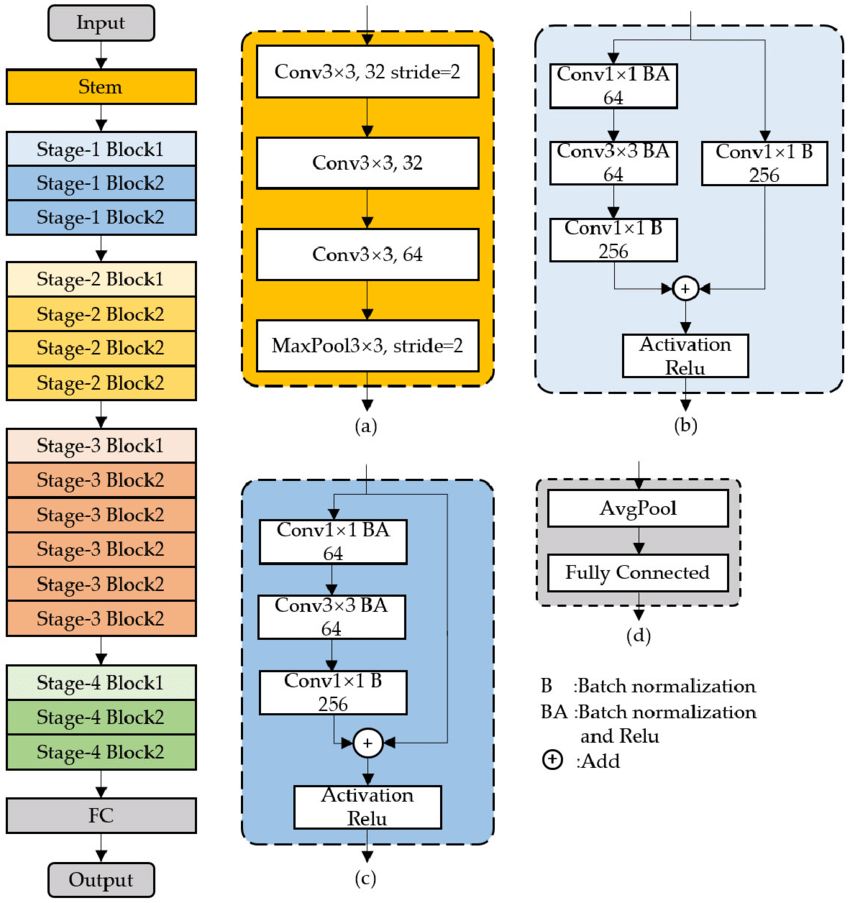

###Manual testing

The 'image_batch' is a tensor of the shape (32, 256, 256, 3). This is a batch of 32 images of shape 256x256x3 (the last dimension refers to color channels RGB). The label_batch is a tensor of the shape (32,), these are corresponding labels to the 32 images.

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 256, 256, 3)
(32,)


In [ ]:
# Define our ResNet model
base_model = ResNet50V2(   include_top=False,
                      weights="imagenet",
                      input_tensor= None,
                      input_shape = input_shape,
                      pooling=None,
                      classes=num_classes,
                      classifier_activation="softmax",
                 )

# Adjust the trainable layers are not trainable ([:-1] means the entire model is not trainable)
for layer in base_model.layers[:-1]:
    layer.trainable = False

#base_model.summary()

# Creating dictionary that maps layer names to the layers
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])

# Getting output tensor of the last VGG layer that we want to include
x = layer_dict['conv5_block3_out'].output

x = keras.layers.GlobalAveragePooling2D()(x)  
x = Flatten()(x)
x = Dense(1024, activation='relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
x = Dense(units=num_classes, activation='softmax')(x)

# Creating new model. Please note that this is NOT a Sequential() model.
from keras.models import Model
model = Model(base_model.input, x)

model.summary()

94668760/94668760 [==============================] - 3s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                           

In [ ]:
# Compile the model
model.compile(
  optimizer= Adam(learning_rate=2e-3),
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy']
)

# Generate data streams from data sets
epochs = 100

es=tf.keras.callbacks.EarlyStopping(monitor='val_loss', verbose=1, patience=3, mode='auto', min_delta=0, restore_best_weights = True)
rl = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, verbose=1, mode='auto', epsilon=0.0001, cooldown=2, min_lr=0)
mc = tf.keras.callbacks.ModelCheckpoint('food-classifier.h5', save_best_only=True)
callbacks =[es,rl,mc]

# Training using existing data
history = model.fit(train_ds,
                    epochs=epochs, 
                    shuffle=True,
                    verbose=1, 
                    batch_size=batch_size,
                    validation_data=valid_ds,
                    callbacks=callbacks
                    )

# Evaluate
test_loss, test_acc = model.evaluate(test_ds)


# Print evalutation
print('Test accuracy: %.3f' % test_acc)

Epoch 1/100
468/468 [==============================] - 29s 55ms/step - loss: 1.1552 - accuracy: 0.6695 - val_loss: 0.9283 - val_accuracy: 0.7162 - lr: 0.0020
Epoch 2/100
468/468 [==============================] - 25s 53ms/step - loss: 0.7590 - accuracy: 0.7580 - val_loss: 0.8053 - val_accuracy: 0.7417 - lr: 0.0020
Epoch 3/100
468/468 [==============================] - 25s 51ms/step - loss: 0.7311 - accuracy: 0.7647 - val_loss: 0.8633 - val_accuracy: 0.7208 - lr: 0.0020
Epoch 4/100
468/468 [==============================] - 25s 53ms/step - loss: 0.7109 - accuracy: 0.7712 - val_loss: 0.7836 - val_accuracy: 0.7597 - lr: 0.0020
Epoch 5/100
468/468 [==============================] - 25s 52ms/step - loss: 0.7062 - accuracy: 0.7727 - val_loss: 0.8960 - val_accuracy: 0.7182 - lr: 0.0020
Epoch 6/100
468/468 [==============================] - ETA: 0s - loss: 0.6878 - accuracy: 0.7778
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0004000000189989805.
468/468 [============================

###visualizing results

In [ ]:
# Evaluate
test_loss, test_acc = model.evaluate(test_ds)


# Print evalutation
print('Test accuracy: %.3f' % test_acc)

46/46 [==============================] - 2s 42ms/step - loss: 0.5956 - accuracy: 0.8064
Test accuracy: 0.806


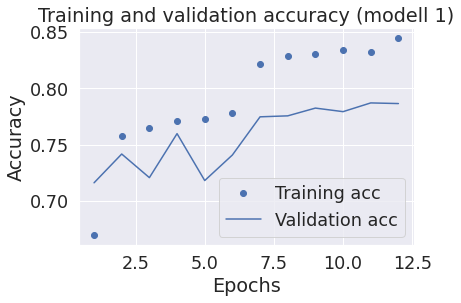

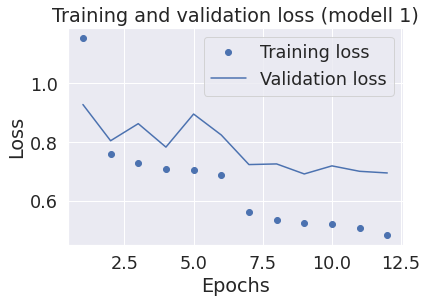

In [ ]:
epochrange = range(1, callbacks[0].stopped_epoch + 2) # change to the epoch it stopped at when adding the early stopping method
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochrange, train_acc, 'bo', label='Training acc')
plt.plot(epochrange, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(epochrange, train_loss, 'bo', label='Training loss')
plt.plot(epochrange, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##Confusion Matrix

46/46 [==============================] - 3s 43ms/step


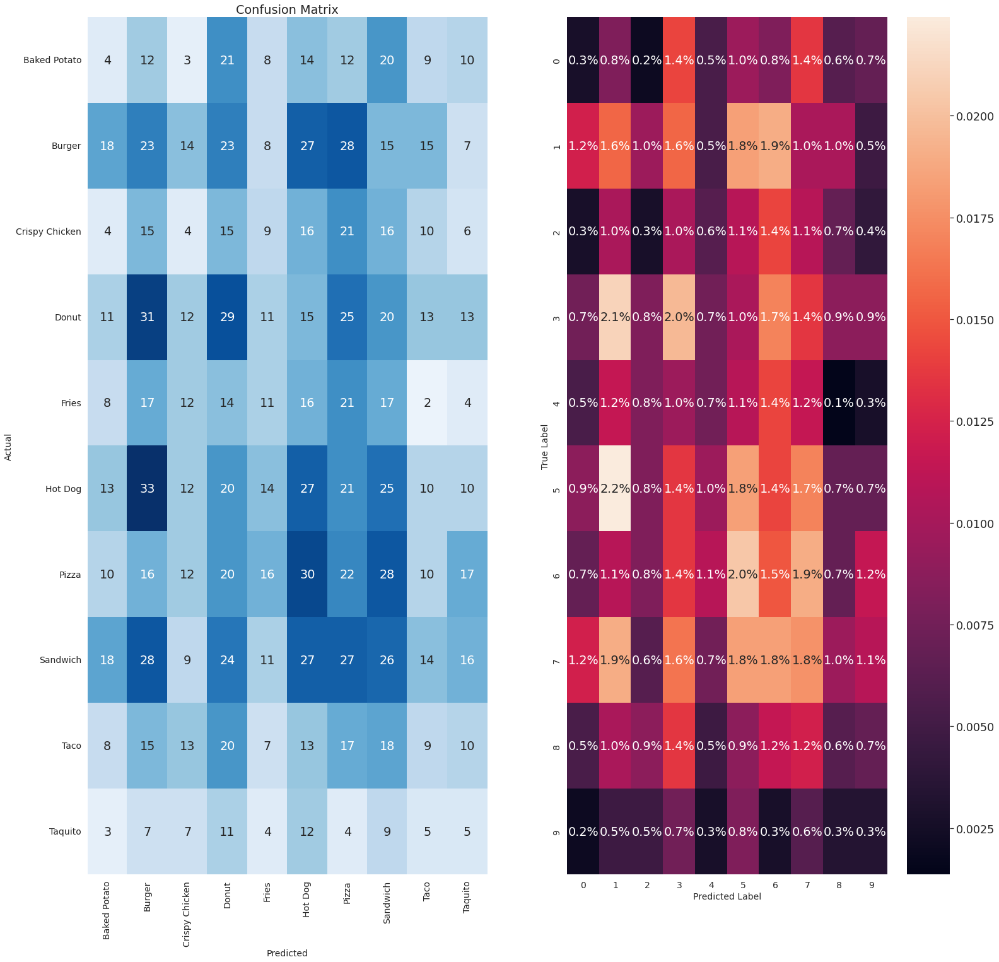

In [ ]:
##plotting the confusion matrix (copied from kaggle)
import itertools
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(valid_ds):
    
    # Predict the values from the validation dataset and convert to one hot vectors 
    predicted_categories = np.argmax(model.predict(valid_ds), axis = 1) 
    true_categories = tf.concat([y for x, y in valid_ds], axis=0)
    # compute the confusion matrix
    cm = confusion_matrix(predicted_categories, true_categories)

    plt.figure(figsize=(25, 25))
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
    plt.xticks(np.arange(num_classes) + .5, class_names, rotation=90, fontsize=14)
    plt.yticks(np.arange(num_classes) + .5, class_names, rotation=0, fontsize=14)
    plt.xlabel("Predicted", fontsize=14)
    plt.ylabel("Actual", fontsize=14)
    plt.title("Confusion Matrix")
    
    plt.subplot(1, 2, 2)
    sns.set(font_scale=1.6)
    sns.heatmap(cm / np.sum(cm), annot=True, fmt='.1%')
    plt.xlabel('Predicted Label', fontsize=14)
    plt.xticks(fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.yticks(fontsize=14)

    plt.show()


# plot the confusion matrix
plot_confusion_matrix(test_ds)

1/1 [==============================] - 0s 21ms/step


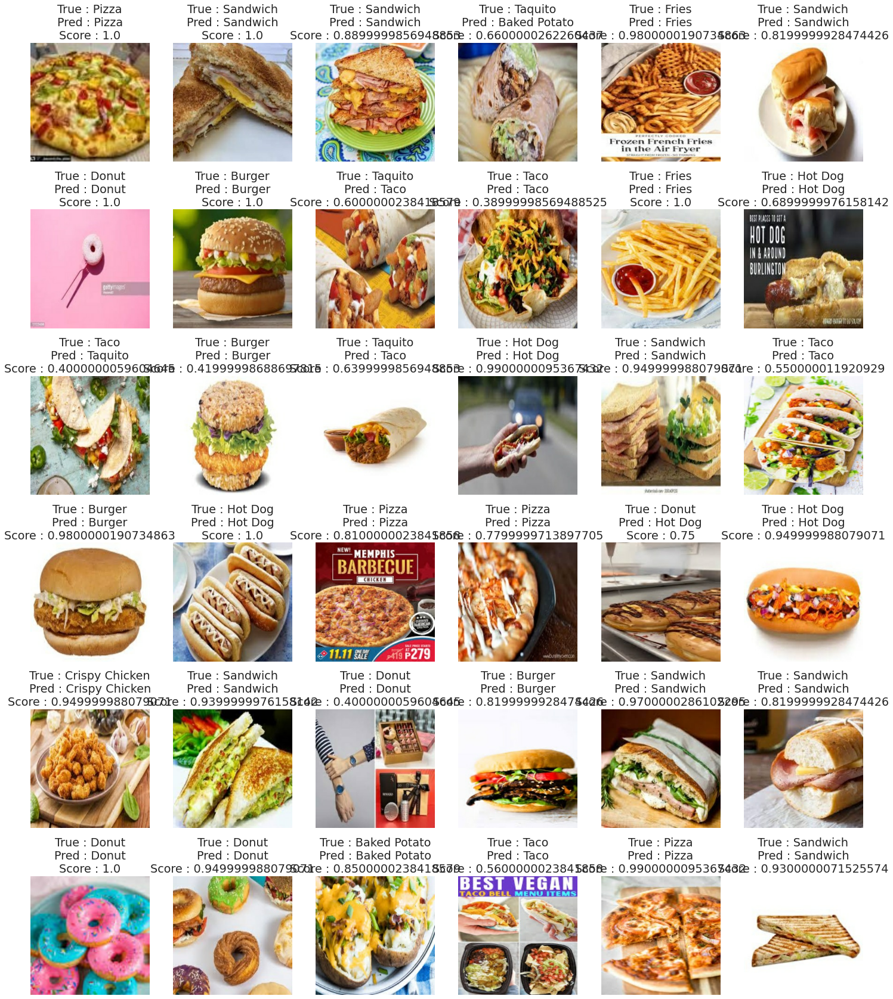

In [ ]:
show_images(test_ds, model=model, SIZE=[25,30])

##Analysis

This model that will be used further is called **mymodel.1**,

* x = keras.layers.BatchNormalization(axis=-1)(x)  
* x = Flatten()(x)
* x = Dense(512, activation='relu')(x)
* x = tf.keras.layers.Dropout(0.5)(x)
* x = Dense(units=num_classes, activation='softmax')(x)


Any further tweak will be labeled mymodel.3 and so on. Thhis helps keep the analysis compact and more readable.


* **ResNet50(Stage 1-4)(untrainble) -> mymodel.1**

Total params: 57,153,162
Trainable params: 33,561,354
Non-trainable params: 23,591,808

Evalutation: 0.07

* **ResNet50(Stage 1-3)(untrainble)-> ResNet50(Stage 4)(trainble)-> mymodel.1 (32 units in Dense Layer)**

Total params: 27,790,570
Trainable params: 7,615,338
Non-trainable params: 20,175,232

Evalutation: 0.07


The rather basic models preformed very poorly. The graph show no generalization taking place with a flat result from epoch 1 to 4 (the epoch it early stopepd on). I'm confused by the result. There are several ways to prevent underfitting in a ResNet model:

* Increase the capacity of the model: A smaller model may not be able to learn the complexity of the data, so increasing the number of layers or the number of neurons in the layers can help to prevent underfitting.

* Data augmentation: Data augmentation is a technique that increases the amount of data by applying random transformations to the existing data, this can help the model to generalize better.

* Add more data: this isn't possible for this task.

I tried adding more capacity to my model by increasing it back to 512 units in the dense layer, increasing the amount of fitting tacking place. I tried implmeneting my learning from the VGG16 model where decreasing the dense, layers units was helpful due to overfitting, forgetting that i am using a much larger model now that requires a lot of parameters.

* **ResNet50(Stage 1-4)(untrainble) -> mymodel.1 (512 units in the dense layer)**

Total params: 90,710,410
Trainable params: 67,118,602
Non-trainable params: 23,591,808

Test accuracy: 0.372

* **ResNet50(Stage 1-4)(untrainble) -> mymodel.1 (1024 units in the dense layer)**

Total params: 157,824,906
Trainable params: 134,233,098
Non-trainable params: 23,591,808

Test accuracy: 0.375

This model that will be used further is called **mymodel.2**,
* x = Flatten()(x)
* x = Dense(units=num_classes, activation='softmax')(x)

Test accuracy: 0.804

This model did tend to overfit, especiall the last one, but as we need to increase the capacity of the model, we need regulization to prevent it from overfitting as the capacity increase in order to fine-tune the model for our task rather than just rely on the overfitting of mymodel.2. I will be adding the following:

* Regularization: Regularization is a technique that helps to prevent overfitting by adding a penalty term to the loss function, this can be done by adding dropout layers, L1 or L2 regularization and etc.

* Callbacks: Callbacks are functions that are executed at different points during the training process. They can be used to perform certain actions such as saving the model, stopping the training early, or adjusting the learning rate. I currently utilize Early stopping and ReduceLROnPlateau.

The following changes i've implemented and tried out:

* Decreasiong the learning rate to Adam(learning_rate=2e-3)
* Addaing a new callback ModelCheckpoint('food-classifier.h5', save_best_only=True)
* Switch out LeakRelu for Dropout(0.5)

All the tweak didn't do much until... GLOBAL AVERAGE POOLING!!!

I used a Global Average Pooling (GAP) layer to reduce the spatial dimensions of the feature map before the FC layer. GAP is a good option to use in the last layers of the network, after the convolutional

This model that will be used further is called **mymodel.3**,

* x = keras.layers.GlobalAveragePooling2D()(x)  
* x = Flatten()(x)
* x = Dense(1024, activation='relu')(x)
* x = tf.keras.layers.Dropout(0.5)(x)
* x = Dense(units=num_classes, activation='softmax')(x)


* Total params: 25,665,034
* Trainable params: 2,108,426
* Non-trainable params: 23,556,608

Test accuracy: 0.815

The training loss decreases and the accuracy is increasing over the first few epochs, but then starts to plateau at around Epoch 6. This is likely when the learning rate is reduced, which is a technique to help the model converge to the optimal solution. The validation accuracy also starts to plateau and decrease after Epoch 6.

After the Epoch 6, the validation accuracy starts to decrease, which is an indication of overfitting, this means that the model is starting to memorize the training data instead of generalizing well to unseen data. The training accuracy increases, but the validation accuracy decrease indicating that the model is not generalizing well and is not suitable for new data.

The training session ends on Epoch 12 with early stopping, as validation data degrades.


### **Confusion Matrix Analysis**

ResNet uses a different approach known as residual connections. Instead of stacking a large number of convolutional layers, ResNet uses a shortcut connection that skips one or more layers, allowing the gradients to flow more easily during training. This makes it possible to train much deeper networks without the problem of vanishing gradients that is often seen in very deep networks.

VGG is known for its ability to learn fine-grained features such as textures and is effective in texture recognition. ResNet architectures are known for their ability to learn more abstract features and are less effective on texture recognition when compared with VGG. is this reflected in the matrix?

Not directly, no. There is a possible explanations for why this might be the case: complex data. As previously mention, if the dataset is complex, it is possible that the model is not able to capture all the patterns in the data, which can lead to misclassifications, but still has learned the main patterns which are enough to achieve a good accuracy score.

The areas of confusion are still found in the the following areas: Tacos, Taquitos, Baked potatoes, cripsy chicken and fries. Hot dog and burger and hot dog and donut are very similar areas of confusion. This is only one of many examples of similarity in confusion. Suggesting the data used has somewhat an influence on this bias.

I would agree with the ResNet picks up more on shapes than texture. a few difference in the points of confusion do reflect a focus on shape. This is seen in the following example: high confusion between sandwiches and burgers, sandwiches and hotdogs, sandwiches and donuts and less confusion caused by the meat of the taco and burgers. 

Thiking this a fast food dataset with many fried food of potato, greater focus on abstract feature results in better result with fries as the shape is disctinct in comparison to the fried potato feel. This could, however, be cause by overfitting av the classes of burger, hot dog, pizza, and sandwich.

The results, as the test accuracy shows, is fairly better and less confusion taking place. Crispy chicken and tacos are often confused. followed by fries and baked potato.



#Applying DenseNet model


DenseNet is a convolutional neural network architecture renowned for its dense connectivity pattern, which confers several key advantages:

1. Dense Connections: In DenseNet, each layer is intricately linked to all subsequent layers, contrasting with the conventional CNNs that connect only to the immediate following layer. This dense connectivity empowers the network to glean more comprehensive and robust features, effectively mitigating the vanishing-gradient problem commonly encountered in deep networks.

2. Transition Layers: Employing transition layers, DenseNet adeptly curtails the number of feature maps and regulates model growth. This distinctive mechanism enables DenseNet to exhibit greater depth and width without succumbing to overfitting, fostering superior performance in complex tasks.

3. Global Average Pooling: At the conclusion of the network, DenseNet incorporates global average pooling. This operation reduces the spatial dimensions of the feature maps and enhances the model's resilience to translation invariance. Consequently, DenseNet becomes more proficient in handling variations and achieving robustness in image recognition tasks, all without the need for manual adjustment.

4. Parameter Efficiency: Compared to traditional CNNs of equivalent depth, DenseNet models exhibit fewer parameters. This parameter efficiency imparts several notable advantages, including accelerated training times and diminished overfitting concerns, thereby enhancing the overall efficiency of the model.

Considering the computational aspect, it is worth noting that DenseNet is a deep architecture with a substantial number of parameters. Consequently, it demands significant computational resources for both training and utilization. However, leveraging high-performance hardware such as GPUs can effectively harness the capabilities of DenseNet, enabling efficient training and inference.

Furthermore, the suitability of DenseNet as a pre-trained model depends on the similarity between the task at hand and the dataset used to train the model. When the classes and images in your specific task exhibit resemblances to those present in the training dataset of DenseNet, employing the pre-trained DenseNet model proves to be a prudent choice, facilitating robust feature extraction and enhancing the performance of your own model.

In comprehensive benchmarks, DenseNet architectures consistently outperform traditional CNNs in terms of accuracy and computational efficiency, particularly in object classification and segmentation tasks. This noteworthy performance advantage has solidified DenseNet's position as a state-of-the-art solution for a range of computer vision applications.

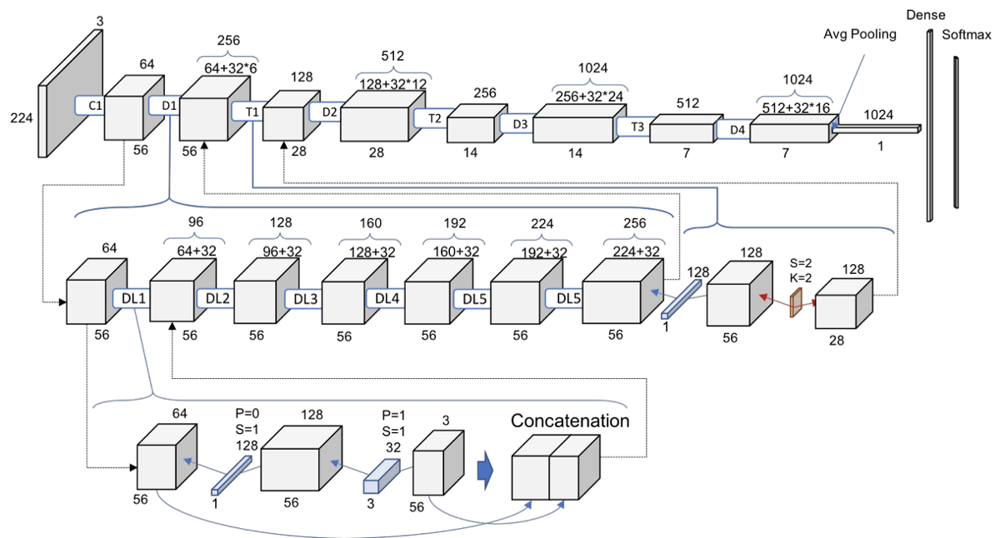

###Manual testing

The 'image_batch' is a tensor of the shape (32, 256, 256, 3). This is a batch of 32 images of shape 256x256x3 (the last dimension refers to color channels RGB). The label_batch is a tensor of the shape (32,), these are corresponding labels to the 32 images.

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(512, 256, 256, 3)
(512,)


In [ ]:
#Repeat the dataset indefinitely
train_ds = train_ds.repeat()

# Define our DensNet model
base_model = DenseNet121(   include_top=False,
                      weights="imagenet",
                      input_tensor= None,
                      input_shape = input_shape,
                      pooling=None,
                      classes=num_classes,
                      classifier_activation="softmax",
                 )

# Adjust the trainable layers are not trainable ([:-1] means the entire model is not trainable)
for layer in base_model.layers[:-1]:
    layer.trainable = False

#base_model.summary()

# Creating dictionary that maps layer names to the layers
layer_dict = dict([(layer.name, layer) for layer in base_model.layers])

# Getting output tensor of the last VGG layer that we want to include
x = layer_dict['relu'].output

x = keras.layers.GlobalAveragePooling2D()(x)  
x = Dense(512, activation='relu')(x)
x = tf.keras.layers.Dropout(0.4)(x)
x = Dense(units=num_classes, activation='softmax')(x)

# Creating new model. Please note that this is NOT a Sequential() model.
from keras.models import Model
model = Model(base_model.input, x)

model.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_15 (InputLayer)          [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d_23 (ZeroPadding  (None, 262, 262, 3)  0          ['input_15[0][0]']               
 2D)                                                                                              
                                                                                                  
 conv1/conv (Conv2D)            (None, 128, 128, 64  9408        ['zero_padding2d_23[0][0]']      
                                )                                                          

In [ ]:
# Compile the model
model.compile(
  optimizer= 'adam',
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy']
)

# Generate data streams from data sets
epochs = 100
steps_per_epoch = 10

es=tf.keras.callbacks.EarlyStopping(monitor='val_loss', verbose=1, patience=3, mode='auto', min_delta=0, restore_best_weights = True)
rl = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, verbose=1, mode='auto', epsilon=0.0001, cooldown=2, min_lr=0)
mc = tf.keras.callbacks.ModelCheckpoint('food-classifier.h5', save_best_only=True)
callbacks =[es,rl,mc]

# Training using existing data
history = model.fit(train_ds,
                    epochs=epochs, 
                    shuffle=True,
                    verbose=1, 
                    batch_size=batch_size,
                    steps_per_epoch=steps_per_epoch,
                    validation_data=valid_ds,
                    callbacks=callbacks
                    )

# Evaluate
test_loss, test_acc = model.evaluate(test_ds)


# Print evalutation
print('Test accuracy: %.3f' % test_acc)

Epoch 1/100
10/10 [==============================] - 18s 1s/step - loss: 1.9502 - accuracy: 0.3600 - val_loss: 1.1990 - val_accuracy: 0.6676 - lr: 0.0010
Epoch 2/100
10/10 [==============================] - 10s 1s/step - loss: 1.0589 - accuracy: 0.6779 - val_loss: 0.9056 - val_accuracy: 0.7259 - lr: 0.0010
Epoch 3/100
10/10 [==============================] - 11s 1s/step - loss: 0.8081 - accuracy: 0.7494 - val_loss: 0.8061 - val_accuracy: 0.7542 - lr: 0.0010
Epoch 4/100
10/10 [==============================] - 10s 1s/step - loss: 0.7327 - accuracy: 0.7691 - val_loss: 0.7803 - val_accuracy: 0.7630 - lr: 0.0010
Epoch 5/100
10/10 [==============================] - 12s 1s/step - loss: 0.6481 - accuracy: 0.7982 - val_loss: 0.7368 - val_accuracy: 0.7767 - lr: 0.0010
Epoch 6/100
10/10 [==============================] - 11s 1s/step - loss: 0.5894 - accuracy: 0.8117 - val_loss: 0.7244 - val_accuracy: 0.7812 - lr: 0.0010
Epoch 7/100
10/10 [==============================] - 10s 1s/step - loss: 0.5

###visualizing results

In [ ]:
# Evaluate
test_loss, test_acc = model.evaluate(test_ds)


# Print evalutation
print('Test accuracy: %.3f' % test_acc)

2/2 [==============================] - 2s 580ms/step - loss: 0.5271 - accuracy: 0.8398
Test accuracy: 0.840


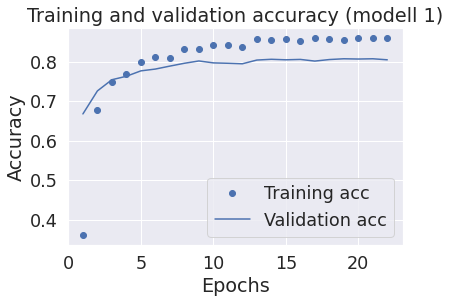

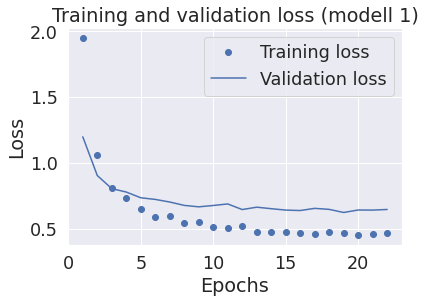

In [ ]:
epochrange = range(1, callbacks[0].stopped_epoch + 2) # change to the epoch it stopped at when adding the early stopping method
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochrange, train_acc, 'bo', label='Training acc')
plt.plot(epochrange, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(epochrange, train_loss, 'bo', label='Training loss')
plt.plot(epochrange, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

##Confusion Matrix

2/2 [==============================] - 3s 987ms/step


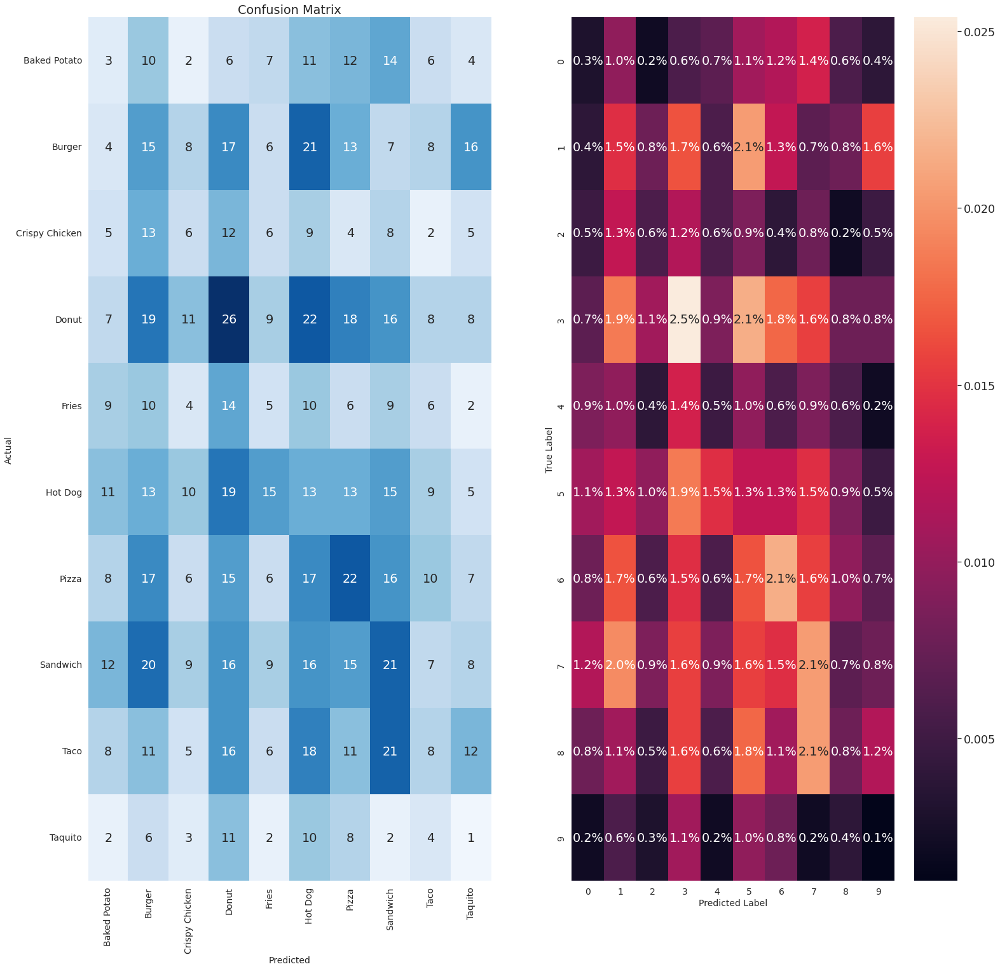

In [ ]:
##plotting the confusion matrix (copied from kaggle)
import itertools
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(test_ds):
    
    # Predict the values from the validation dataset and convert to one hot vectors 
    predicted_categories = np.argmax(model.predict(test_ds), axis = 1) 
    true_categories = tf.concat([y for x, y in test_ds], axis=0)
    # compute the confusion matrix
    cm = confusion_matrix(predicted_categories, true_categories)

    plt.figure(figsize=(25, 25))
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
    plt.xticks(np.arange(num_classes) + .5, class_names, rotation=90, fontsize=14)
    plt.yticks(np.arange(num_classes) + .5, class_names, rotation=0, fontsize=14)
    plt.xlabel("Predicted", fontsize=14)
    plt.ylabel("Actual", fontsize=14)
    plt.title("Confusion Matrix")
    
    plt.subplot(1, 2, 2)
    sns.set(font_scale=1.6)
    sns.heatmap(cm / np.sum(cm), annot=True, fmt='.1%')
    plt.xlabel('Predicted Label', fontsize=14)
    plt.xticks(fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.yticks(fontsize=14)

    plt.show()


# plot the confusion matrix
plot_confusion_matrix(test_ds)

1/1 [==============================] - 0s 28ms/step


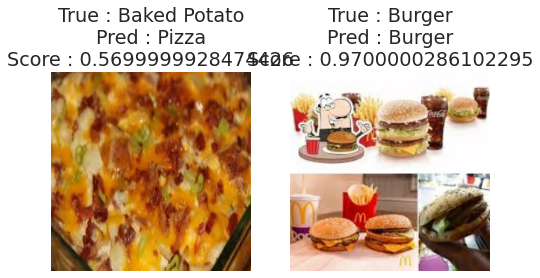

In [ ]:
show_images(test_ds, model=model, SIZE=[25,30])

##Analysis

This model that will be used further is called,

**mymodel.1:**

* x = keras.layers.GlobalAveragePooling2D()(x)  
* x = Dense(1024, activation='relu')(x)
* x = tf.keras.layers.Dropout(0.5)(x)
* x = Dense(units=num_classes, activation='softmax')(x)

Params:

*   Total params: 8,097,354
*   Trainable params: 1,059,850
*   Non-trainable params: 7,037,504

The following a few of the trainings sessions,

* **DenseNet50(untrainble) -> mymodel.1**

Test accuracy: 0.821

The steps_per_epoch was 625 and batch size was 32. lead to cutting the training short due to running out of data. By testing BiT model, i realized the DenseNet121 needs more data if applying the steps_per_epoch (625 was a misunderstanding of steps_per_epoch is 20 000/32). I decided to reduce it to 10 and increase the batch to 512. 

**mymodel.2:**
I tried FC: Dense(512) followed by a dropout(0.4), the training was longer but the model wasn't overfitting. Achieving a test result of 0.84. Ever so slightly increasing by 0.01 per epoch to achieve this accuracy.

The accuracy of the model was about 84% on the validation set, which is quite good. But, the validation accuracy was not improving a lot in later epochs and the difference between the accuracy of training set and validation set is not much, which suggest that the model may be overfitting.

This training session suggests that the model is learning and improving, as the training accuracy and validation accuracy are increasing over the course of the training. However, it also suggests that the model may be overfitting to the training data, as the validation accuracy plateaus after a certain number of epochs, while the training accuracy continues to increase. ReduceLROnPlateau increases could bne the reasoning for the plateau. The model did respond quite the same to multiple mode.evaluation() suggesting a more consistent, less-risl of over-generalizing model.

In general, the training result is indicating that the model is learning and improving over time, and the performance on the validation set is in line with the performance on the training set, which is a good sign that the model is generalizing well.

I tried taking away certain blocks from the model, but accuracy plummeted to 0.7 to 0.8 at best. I tried other mymodels but nothing note worthy. A possibility is fine-tuning the model but is not in the scope of this project.

### **Confusion matrix analysis**

DenseNet is an architecture that builds on the idea of ResNet and uses a different approach called dense connections. DenseNet connects all layers in a feed-forward fashion, which allows the network to reuse features learned by earlier layers and makes the training more efficient. DenseNet are known for their ability to extract multiple features, such as texture and shape, and are less prone to overfitting when compared with VGG.

DenseNet offers a middle ground suitable for this dataset. The confusion matrix blue is the most diagnal, i.e. most accurate amongst all classes. It doesnt, however, glow a stark dark blue at any level except when it comes to donuts.  The means it extracts a multitiude of features but the weights aren't fine-tuned for the dataset. 


The struggles of the VGG and ResNet are both found here, but causing much less confusion. The areas of confusion are the following: Tacos, Taquitos, Baked potatoes, cripsy chicken and fries, yet overall a better accuracy than VGG16 and ResNet50V2.This is mainly as well to the tendancy on not overfitting, as seen in the confusion level of burger with pizza and sandwich (found ion all three), there was less overfitting on the breads texture for example or shape/form of a sandwich and a burger.

# Applying BiT model (ResNet50 fine-tuned on the ImageNet "food" subtree)


Big Transfer (BiT) is an advanced pre-trained model developed by Google, leveraging the ResNet50 architecture as its foundation. Let's delve into the key features and capabilities that set BiT apart:

1. Large-scale Pre-training: BiT undergoes pre-training on an extensive dataset, enabling it to acquire a broad spectrum of features and representations. This comprehensive training empowers the model with a rich understanding of diverse visual concepts.

2. Transfer Learning: Designed with versatility in mind, BiT can be fine-tuned on various tasks such as image classification, object detection, and segmentation. This adaptability proves invaluable when working with limited labeled data, as BiT's pre-trained knowledge facilitates enhanced performance on downstream tasks.

3. State-of-the-art Performance: BiT has achieved exceptional performance on numerous benchmarks, earning its position at the forefront of advancements in image classification and object detection. Its efficacy in these domains has been thoroughly validated.

4. Multi-task Learning: The pre-training process of BiT incorporates a multi-task objective, enabling the model to assimilate a diverse range of features that prove beneficial for different tasks. This holistic approach ensures that BiT acquires a comprehensive understanding of visual information.

5. Large Number of Parameters: BiT boasts a substantial number of parameters, allowing it to learn complex and intricate features. However, this richness in parameters necessitates significant computational resources for both training and deployment.

6. Pre-training on Diverse Data: BiT is pre-trained on a diverse and extensive dataset. This diversity instills the model with a robustness to variations in input images, facilitating its ability to generalize well across a wide range of visual scenarios.

7. Multi-scale and Multi-resolution Capability: BiT's pre-training encompasses multi-scale and multi-resolution data, enabling it to learn features at different scales. This versatility equips the model with enhanced robustness to variations in object sizes within images, ensuring consistent performance across diverse image scales.

By encompassing these prominent features, BiT demonstrates its prowess as a powerful pre-trained model capable of tackling a multitude of computer vision tasks with excellence.

##Manual testing

In [ ]:
!pip install --upgrade tensorflow_hub

import tensorflow_hub as hub


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Define our ResNet model
base_model = hub.KerasLayer("https://tfhub.dev/google/experts/bit/r50x1/in21k/food/1")

base_model.trainable = False

model = Sequential([base_model,
                    tf.keras.layers.Dropout(0.2), 
                    Dense(num_classes, kernel_initializer='zeros', activation='softmax')])

In [ ]:
epochs = 50
steps_per_epoch = 10 # decreased from 10 because I ran out of data before the model finished training, but the result was worse

EPOCHS = 50
STEPS_PER_EPOCH = 10

#Repeat the dataset indefinitely
train_ds = train_ds.repeat()

SCHEDULE_LENGTH = 10000
lr = 0.003 * BATCH_SIZE / 512 
SCHEDULE_LENGTH = SCHEDULE_LENGTH * 512 / BATCH_SIZE

SCHEDULE_BOUNDARIES = [3000, 6000, 9000]
SCHEDULE_VALUES = [lr, lr*0.1, lr*0.001, lr*0.0001]

DATASET_NUM_TRAIN_EXAMPLES = 15000

In [ ]:
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.optimizers.schedules import PiecewiseConstantDecay


# Decay learning rate by a factor of 10 at SCHEDULE_BOUNDARIES.
schedule = PiecewiseConstantDecay(SCHEDULE_BOUNDARIES, SCHEDULE_VALUES)

#Define optimiser and loss
optimizer = tf.keras.optimizers.SGD(momentum=0.9)
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# Compile the model
model.compile(
  optimizer=optimizer,
  loss=loss_fn,
  metrics=['accuracy']
)

lr_scheduler = LearningRateScheduler(schedule)
es=tf.keras.callbacks.EarlyStopping(monitor='val_loss', verbose=1, patience=3, mode='auto', min_delta=0, restore_best_weights = True)
rl = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, verbose=1, mode='auto', epsilon=0.0001, cooldown=2, min_lr=0)
mc = tf.keras.callbacks.ModelCheckpoint('food-classifier.h5', save_best_only=True)
callbacks =[es,rl,mc, lr_scheduler]

# Training using existing data
history = model.fit(train_ds,
                    epochs=epochs, 
                    shuffle=True,
                    verbose=1, 
                    batch_size=batch_size,
                    steps_per_epoch=steps_per_epoch,
                    validation_data=valid_ds,
                    callbacks=callbacks
                    )

# Evaluate
test_loss, test_acc = model.evaluate(test_ds)


# Print evalutation
print('Test accuracy: %.3f' % test_acc)

Epoch 1/50
10/10 [==============================] - 17s 1s/step - loss: 0.3661 - accuracy: 0.8969 - val_loss: 0.4976 - val_accuracy: 0.8630 - lr: 0.0030
Epoch 2/50
10/10 [==============================] - 12s 1s/step - loss: 0.3237 - accuracy: 0.9059 - val_loss: 0.4513 - val_accuracy: 0.8776 - lr: 0.0030
Epoch 3/50
10/10 [==============================] - 13s 1s/step - loss: 0.3209 - accuracy: 0.9043 - val_loss: 0.4407 - val_accuracy: 0.8822 - lr: 0.0030
Epoch 4/50
10/10 [==============================] - 12s 1s/step - loss: 0.3007 - accuracy: 0.9137 - val_loss: 0.3866 - val_accuracy: 0.8965 - lr: 0.0030
Epoch 5/50
10/10 [==============================] - 12s 1s/step - loss: 0.2801 - accuracy: 0.9137 - val_loss: 0.3940 - val_accuracy: 0.8896 - lr: 0.0030
Epoch 6/50
10/10 [==============================] - ETA: 0s - loss: 0.2593 - accuracy: 0.9225
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0006000000052154065.
10/10 [==============================] - 12s 1s/step - loss: 0.25

##visualizing results

In [ ]:
# Evaluate
test_loss, test_acc = model.evaluate(test_ds)


# Print evalutation
print('Test accuracy: %.3f' % test_acc)

2/2 [==============================] - 3s 1s/step - loss: 0.2668 - accuracy: 0.9170
Test accuracy: 0.917


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (512, 2048)               23500352  
                                                                 
 dropout_12 (Dropout)        (512, 2048)               0         
                                                                 
 dense_25 (Dense)            (512, 10)                 20490     
                                                                 
Total params: 23,520,842
Trainable params: 20,490
Non-trainable params: 23,500,352
_________________________________________________________________


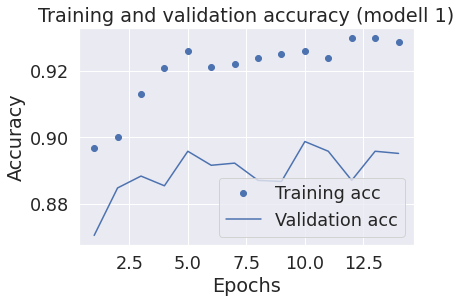

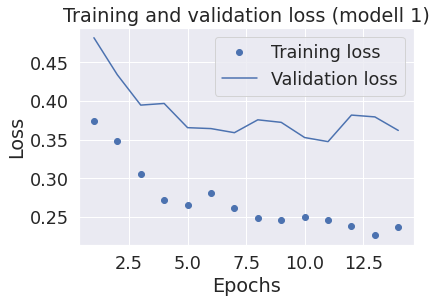

In [ ]:
epochrange = range(1, callbacks[0].stopped_epoch + 2) # change to the epoch it stopped at when adding the early stopping method
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

train_loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(epochrange, train_acc, 'bo', label='Training acc')
plt.plot(epochrange, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(epochrange, train_loss, 'bo', label='Training loss')
plt.plot(epochrange, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss (modell 1)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

###Confusion Matrix

2/2 [==============================] - 3s 2s/step


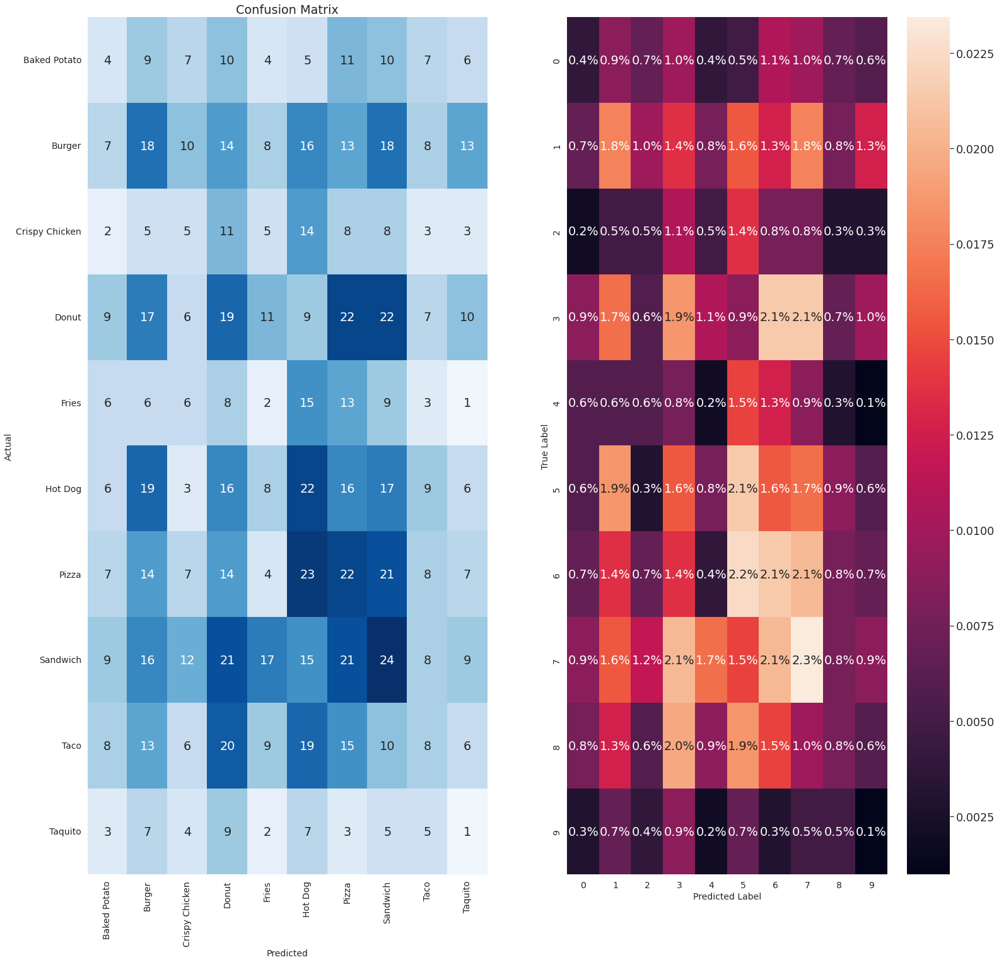

In [ ]:
##plotting the confusion matrix (copied from kaggle)
import itertools
from sklearn.metrics import confusion_matrix
import seaborn as sns

def plot_confusion_matrix(test_ds):
    
    # Predict the values from the validation dataset and convert to one hot vectors 
    predicted_categories = np.argmax(model.predict(test_ds), axis = 1) 
    true_categories = tf.concat([y for x, y in test_ds], axis=0)
    # compute the confusion matrix
    cm = confusion_matrix(predicted_categories, true_categories)

    plt.figure(figsize=(25, 25))
    plt.subplot(1, 2, 1)
    sns.heatmap(cm, annot=True, vmin=0, fmt='g', cmap='Blues', cbar=False)
    plt.xticks(np.arange(num_classes) + .5, class_names, rotation=90, fontsize=14)
    plt.yticks(np.arange(num_classes) + .5, class_names, rotation=0, fontsize=14)
    plt.xlabel("Predicted", fontsize=14)
    plt.ylabel("Actual", fontsize=14)
    plt.title("Confusion Matrix")
    
    plt.subplot(1, 2, 2)
    sns.set(font_scale=1.6)
    sns.heatmap(cm / np.sum(cm), annot=True, fmt='.1%')
    plt.xlabel('Predicted Label', fontsize=14)
    plt.xticks(fontsize=14)
    plt.ylabel('True Label', fontsize=14)
    plt.yticks(fontsize=14)

    plt.show()


# plot the confusion matrix
plot_confusion_matrix(test_ds)

1/1 [==============================] - 0s 28ms/step


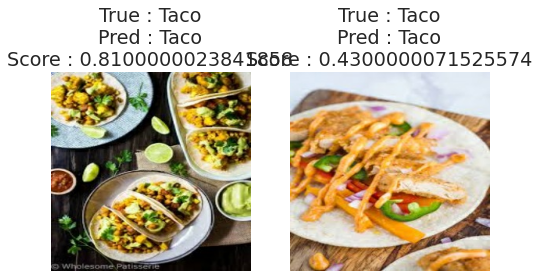

In [ ]:
show_images(test_ds, model=model, SIZE=[25,30])

##Analysis

This model that will be used further is called **mymodel.1**,

* x = Dense(units=num_classes, activation='softmax')(x)

Parameters

* Total params: 23,520,842
* Trainable params: 20,490
* Non-trainable params: 23,500,352


This model that will be used further is called **mymodel.2**,
* x = Dense(1024, activation='relu')(x)
* x = tf.keras.layers.Dropout(0.5)(x)
* x = Dense(units=num_classes, activation='softmax')(x)

Parameters

* Total params: 25,608,778
* Trainable params: 2,108,426
* Non-trainable params: 23,500,352

This model that will be used further is called **mymodel.3**,

* x = Flatten()(x)
* x = tf.keras.layers.Dropout(0.2)(x)
* x = Dense(num_classes, kernel_initializer='zeros', activation='softmax')(x)

Parameters

* Total params: 23,520,842
* Trainable params: 20,490
* Non-trainable params: 23,500,352



* **BiT(untrainble) -> mymodel.1**

Test accuracy: 0.878 

I used a learning_scheduler with SGD and Adam scheduler which is recommended with BiT, but the results were lower, falling to: 

SGD w lr:Test accuracy: 0.843

* **BiT(untrainble) -> mymodel.2**

* Adam: Test accuracy: 0.899

I used a learning_scheduler with SGD and Adam scheduler, the Adam optimizer with learning rate scheduler but the results were lower, falling

* SGD w lr: Test accuracy: 0.895
* Adam w lr: Test accuracy: 0.906


Test accuracy: 0.861

The problem is because of early stopping, im directly getting only 2 epochs. not getting so much of a chance to analyze why it is stopping so early. Miught be overfittings super fast.

I increased the batch_size to 512, decreased steps to 10, and included the LearningRateScheduler they recommend and the results improved immensly. This model has huge potential i began with very high val_acc of 0.94 for 3 epochs straight, but sadly the dataset of 20k is mere pocket change for this behemoth and the data runs out. Using dataset.repeat() and decreasing the steps_per_epoch decreases our result back to 0.910s. It is important to note that this was achieved without a SGD and lr_Scheduler, so it might have overly fast leanring and result plummet afterwards. 

A learning rate scheduler is used to adjust the learning rate of a model during training. It is used to help the model converge faster and improve performance by gradually decreasing the learning rate as the model learns the features of the dataset. This is done to prevent the model from overshooting a good solution, which is common when using a fixed high learning rate.

Using the tf.data.Dataset.repeat() method to repeatedly iterate over a dataset can cause overfitting if the dataset is not large enough or if the model is over-parameterized. This is because the model may memorize the examples in the dataset and will not generalize well to new examples. It is important to have a large enough dataset and to use techniques such as data augmentation, regularization, and early stopping to prevent overfitting.

When adding repeat() the model often runs to overfitting and acc increase while the valid_acc, a lr_scheduler help not overfit. Using SGD or Adam without lr scheduler achieved 0.94s, but stopped at epoch 3 because it ran out of data. When adding a lr_scheduler it achieved 0.916 val_Acc at epoch 3. 

How will it have been if i had more data rather than repeat? this could be interesting point for further research.

* **BiT(untrainble) -> mymodel.3**

* Adam w/o lr: Test accuracy: 0.910  (w/o lr result vary greatly)
* Adam w/ lr: Test accuracy: 0.908
* SGD w/ lr : Test accuracy: 0.916

* **BiT(untrainble) -> mymodel.1**

* Adam w/ lr: Test accuracy: 0.899
* SGD w/ lr : Test accuracy: 0.904


I tried decreasing my scheduler length an boundries for the less than 20k dataset recommended, to test out if that out achieve better learning with dataset.repeat.

SCHEDULE_LENGTH = 500
SCHEDULE_BOUNDARIES = [200, 300, 400]

Another recommendation from Googles biT is using resize to 512x512 and crop to 480x480. However, my session crashes due to high ram. i tried pipelining, but i still ran into troubles with the premium GPU and high-ram session.

This training session suggests that the model is performing well, as the accuracy is increasing and the loss is decreasing over time. The validation accuracy is also increasing and is reaching around 89% at its peak. The learning rate is being reduced on twice, on 9th and 13th epochs, as it reached the "plateau" on validation accuracy. The best epoch is 11th with validation accuracy of 89.58%. The training is stopped at 14th epoch with an early stopping, which means the model is not improving further after 11th epoch. it suggests that the model is doing well, neither overfitting or underfitting


### **Confusion matrix**

BiT focuses on learning a wide range of features from a large dataset, generalizing well to new tasks and datasets, and fine-grained features recognition. Especially this model is fine-tuned on the ImageNet "food" subtree. This allows it to achieve better results for this specific task.

The struggles are the same, nothing new to mention from previous analyse of DenseNet. BiT just preforms all-around betters than DenseNet, with the same areas of confusion.



#Conclusion

Through the analysis of the dataset and confusion matrices, we observed that the models encountered difficulties with certain images. To enhance the model's performance, refinement of the dataset can be considered through the following approaches:

1. Adding Classes: Introducing additional classes such as "baked potato cubes and baked potato sliced" or "Crispy Chicken burger and beef burger" could help the models differentiate between similar food items with distinct characteristics.

2. Removing/Replacing Images: The dataset could benefit from the removal or replacement of images that do not adequately focus on the food item. However, it is important to strike a balance as the model should also be trained to handle real-world scenarios where food items may be accompanied by side dishes, such as burgers with fries.

During the training process, the models learn to extract features from images, including edges, textures, and shapes, which are essential for object recognition. The architectural differences between VGG, ResNet, and DenseNet contribute to their respective feature extraction capabilities:

1. VGG: Known for its ability to extract fine-grained features like edges and textures from images.
2. ResNet: Enables extraction of both fine-grained and high-level features through residual connections, although it may struggle with certain food items that rely more on shape than texture.
3. DenseNet: Utilizes dense connections to encourage feature reuse, allowing for extraction of both fine-grained and high-level features. This architecture shows promise for efficient representations of data.
Further research could involve fine-tuning the DenseNet121 model specifically on the "food" subtree within the ImageNet dataset. This approach may yield improved performance on the fast food image classification task.

In our analysis, we observed that ResNet50's struggles with Taco, potentially due to its focus on shapes rather than texture, were still evident in BiT. The limitations of the ResNet architecture seemed to hinder the performance of the fine-tuned BiT model. On the other hand, DenseNet showcased better performance on the confusion matrix, with fewer areas of confusion and a more prominent diagonal line. The ability of DenseNet to consider both texture and shape made it less prone to confusion among certain fast food items, such as those made of brioche bread or topped with cheese. It is hypothesized that fine-tuning the DenseNet121 model could potentially exceed an accuracy of 94%, based on an analysis of the architecture, dataset, and the noticeable improvement from ResNet50 to BiT.

In conclusion, the choice of architecture plays a significant role in the model's ability to extract relevant features for accurate image classification. DenseNet shows promise for further improvement, and additional fine-tuning on a specific subset of the ImageNet dataset can be explored to enhance its performance on the fast food classification task.
 

